## Analiza danych klimatycznych na obszarze masywu górskiego Serra da Estrela oraz w przyległych regionach wschodniej Portugalii i zachodniej Hiszpanii w latach 1995-2024.

In [39]:
# importy potrzebnych bibliotek i określenie głównej ścieżki

import xarray as xr
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pymannkendall as mk

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

main_path = r'C:\Users\bagaw\Desktop\sem5\ML\climat_project'


In [2]:
ds_final = xr.open_dataset(r'C:\Users\bagaw\Desktop\sem5\ML\climat_project\full_data_2.nc', engine='h5netcdf')

# Liczba wartości brakujących
print('\n Ilość wartości brakujących: \n', ds_final.isnull().sum())
print('\n Informacje o danych: \n', ds_final.info())
print('\n Informacje o koordynatach i czasie: \n', ds_final.coords)


 Ilość wartości brakujących: 
 <xarray.Dataset> Size: 104B
Dimensions:     ()
Data variables: (12/13)
    swvl1       int64 8B 0
    swvl2       int64 8B 0
    swvl3       int64 8B 0
    swvl4       int64 8B 0
    cape        int64 8B 0
    t2m         int64 8B 0
    ...          ...
    sf          int64 8B 0
    ssrd        int64 8B 0
    e           int64 8B 0
    tp          int64 8B 0
    wind_speed  int64 8B 0
    wind_dir    int64 8B 0
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
xarray.Dataset {
dimensions:
	time = 43832 ;
	latitude = 8 ;
	longitude = 4 ;

variables:
	float32 swvl1(time, latitude, longitude) ;
		swvl1:long_name = Volumetric soil water layer 1 ;
		swvl1:units = m**3 m**-3 ;
		swvl1:standard_name = unknown ;

In [3]:
# Sprawdzenie poprawności osi czasu

time_index = ds_final.time.to_index()
is_unique = time_index.is_unique
is_monotonic = time_index.is_monotonic_increasing

print(is_unique, is_monotonic)

ideal_time = pd.date_range(start=time_index.min(), end=time_index.max(), freq='6h')

missing_times = ideal_time.difference(time_index)

if len(missing_times) == 0:
    print("Oś czasu jest kompletna")
else:
    print(f"Brakuje {len(missing_times)} kroków czasowych.")



True True
Oś czasu jest kompletna


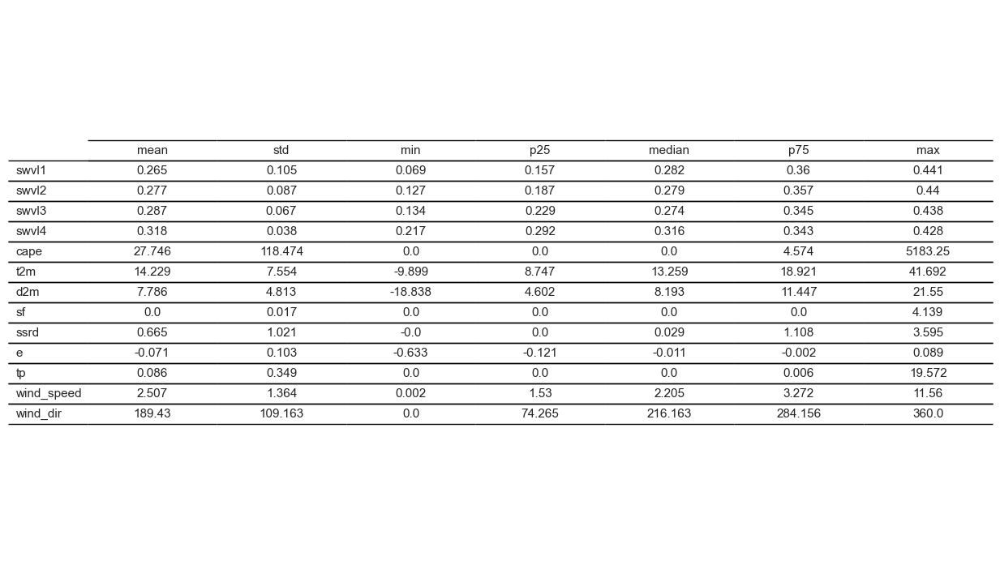

In [4]:
def get_full_summary(ds):
    summary_list = []
    for var in ds.data_vars:
        data = ds[var]
        stats_dict = {
            'variable': var,
            'mean':   float(data.mean()),
            'std':    float(data.std()),
            'min':    float(data.min()),
            'p25':    float(data.quantile(0.25)),
            'median': float(data.quantile(0.5)),
            'p75':    float(data.quantile(0.75)),
            'max':    float(data.max()),
        }
        summary_list.append(stats_dict)
    
    summary_df = pd.DataFrame(summary_list).set_index('variable')
    return summary_df.round(3) 

full_summary = get_full_summary(ds_final)

import matplotlib.pyplot as plt
import pandas as pd
fig, ax = plt.subplots(figsize=(12, len(full_summary) * 0.6 + 1))
ax.axis('off')

tab = ax.table(
    cellText=full_summary.values,
    colLabels=full_summary.columns,
    rowLabels=full_summary.index,
    cellLoc='center',
    loc='center',
    edges='horizontal' 
)
tab.auto_set_font_size(False)
tab.set_fontsize(11)
tab.scale(1.2, 1.5)
plt.savefig("summary_table_clean.png", bbox_inches='tight', dpi=300, transparent=False)
plt.show()


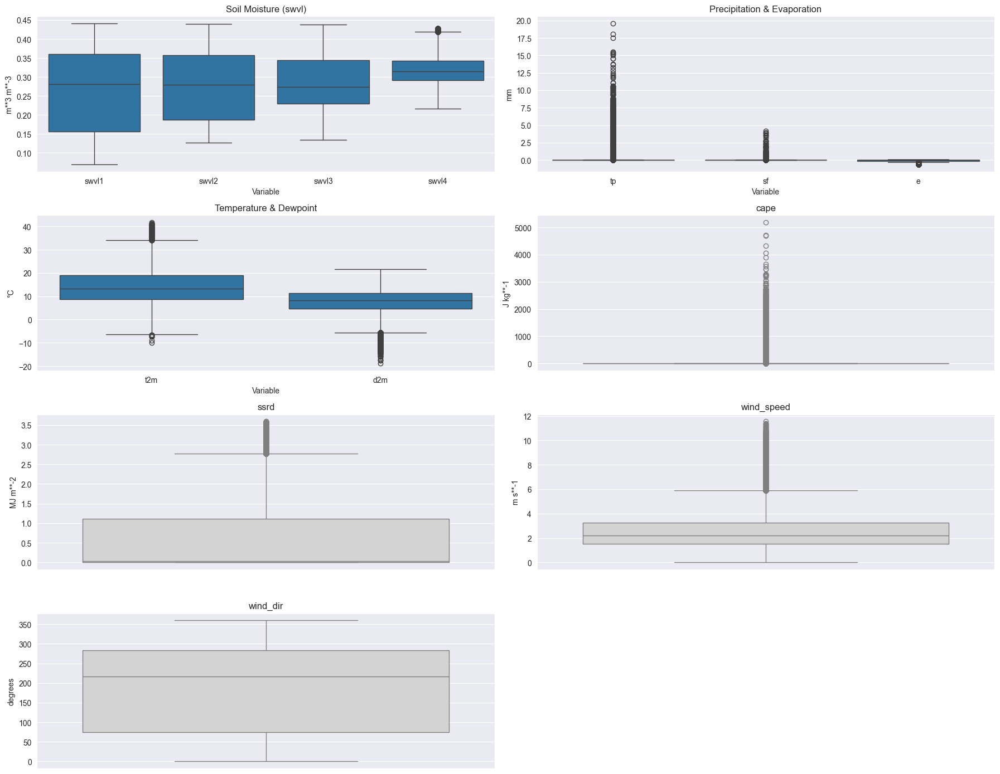

In [5]:
#Boxploty
df_all = ds_final.to_dataframe().reset_index()

groups = {
    "Soil Moisture (swvl)": ['swvl1', 'swvl2', 'swvl3', 'swvl4'],
    "Precipitation & Evaporation": ['tp', 'sf', 'e'],
    "Temperature & Dewpoint": ['t2m', 'd2m']
}

grouped_vars = [item for sublist in groups.values() for item in sublist]
single_vars = [v for v in ds_final.data_vars if v not in grouped_vars]

total_plots = len(groups) + len(single_vars)
fig, axes = plt.subplots(nrows=(total_plots + 1) // 2, ncols=2, figsize=(18, 14))
axes = axes.flatten()

current_plot = 0

for title, vars_list in groups.items():
    available_vars = [v for v in vars_list if v in df_all.columns]
    if not available_vars:
        continue

    df_group = df_all.melt(value_vars=available_vars, var_name='Variable', value_name='Value')
    sns.boxplot(data=df_group, x='Variable', y='Value', ax=axes[current_plot])
    axes[current_plot].set_title(title)

    # jednostki dla grupy
    units = {ds_final[v].attrs.get('units', '') for v in available_vars}
    if len(units) == 1:
        axes[current_plot].set_ylabel(next(iter(units)))
    else:
        axes[current_plot].set_ylabel("mixed units")

    current_plot += 1

for var in single_vars:
    sns.boxplot(data=df_all, y=var, ax=axes[current_plot], color='lightgray')
    axes[current_plot].set_title(f"{var}")
    axes[current_plot].set_ylabel(ds_final[var].attrs.get('units', ''))
    current_plot += 1

for j in range(current_plot, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.savefig(
    "boxploty.jpg",
    dpi=300,
    facecolor="white",      
    bbox_inches="tight"
)

plt.show()


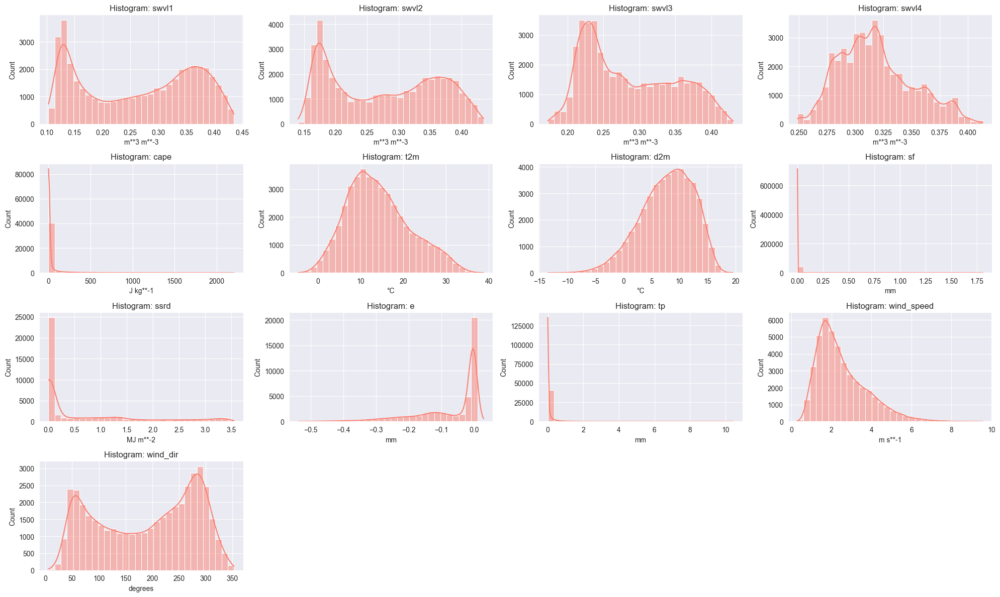

In [17]:
#Histogramy
df_plot = ds_final.mean(dim=['latitude', 'longitude']).to_dataframe().reset_index()
vars_to_plot = [v for v in df_plot.columns if v not in ['time', 'latitude', 'longitude']]

fig, axes = plt.subplots(nrows=(len(vars_to_plot) + 3) // 4, ncols=4, figsize=(20, 12))
axes = axes.flatten()

for i, var in enumerate(vars_to_plot): 
    sns.histplot(data=df_plot, x=var, ax=axes[i], kde=True, bins=30, color='salmon')
    axes[i].set_title(f'Histogram: {var}')
    axes[i].set_xlabel(ds_final[var].attrs.get('units', ''))

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.savefig(
    "histogramy.jpg",
    dpi=300,
    facecolor="white",      
    bbox_inches="tight"
)

plt.show()

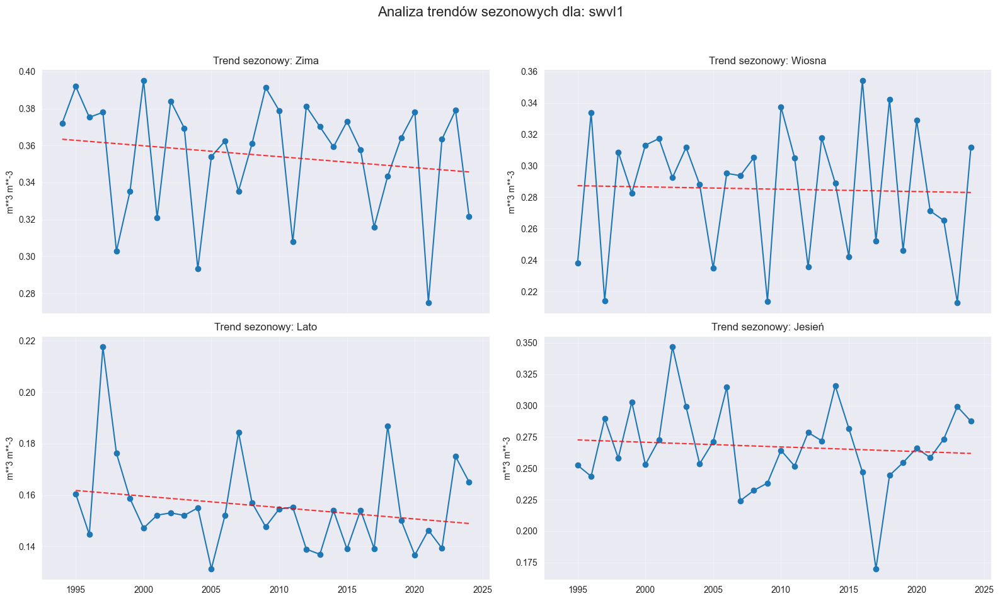

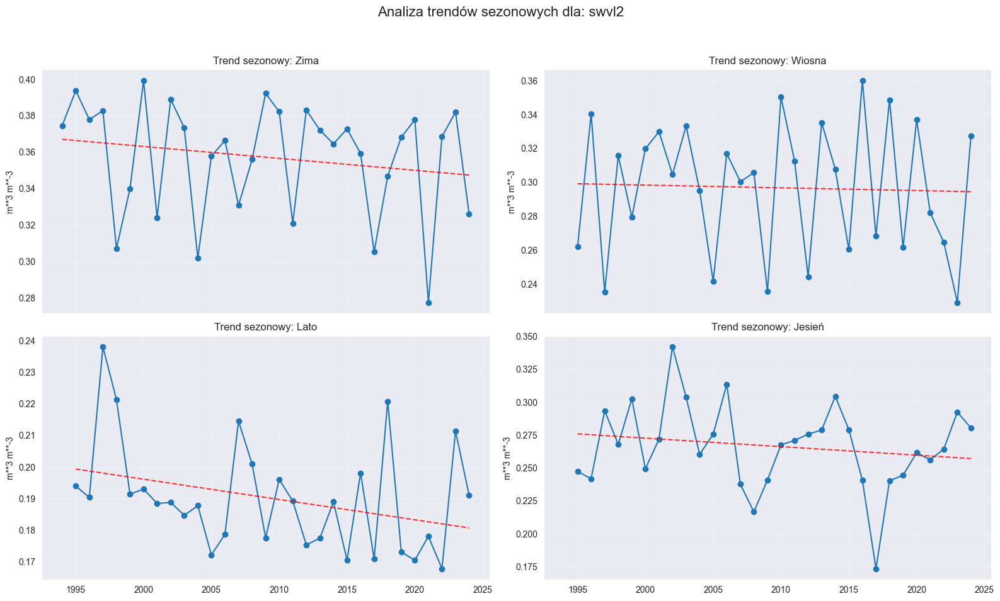

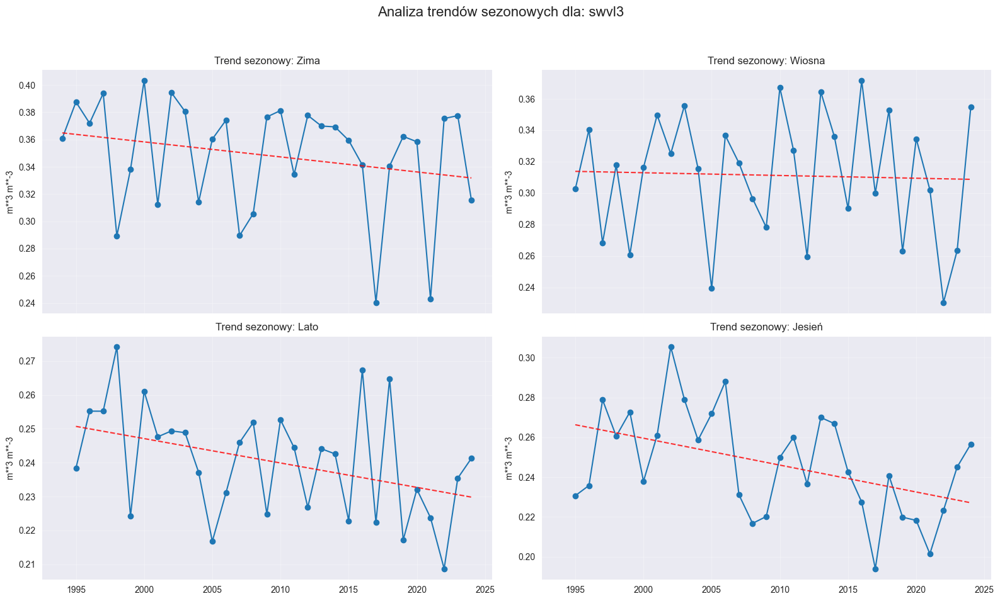

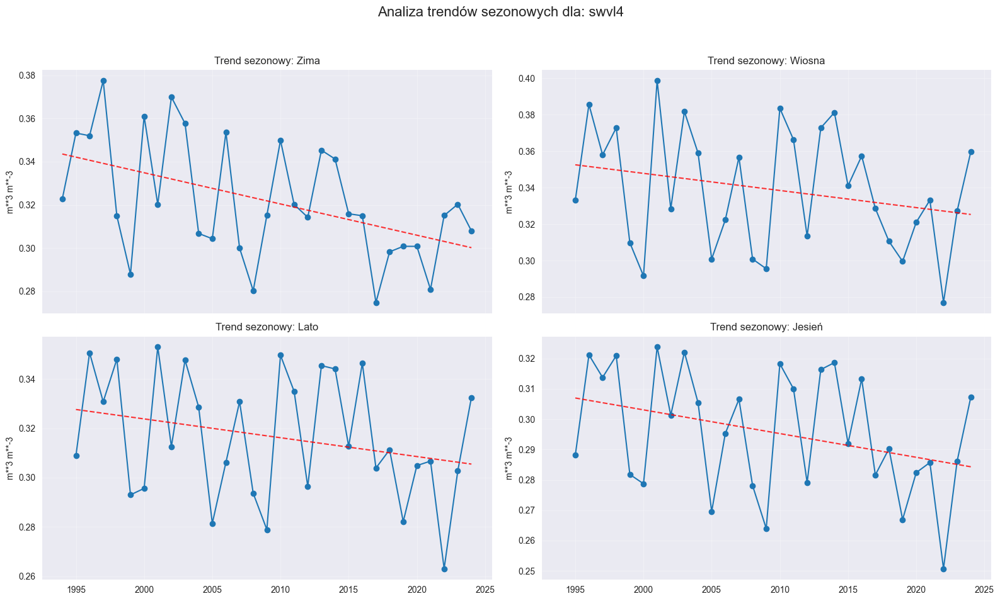

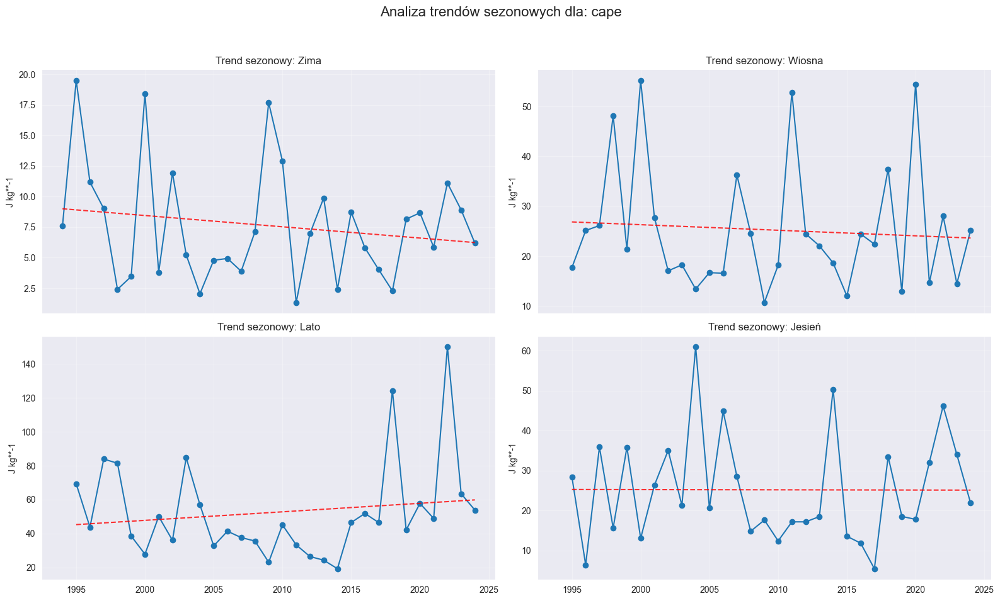

...

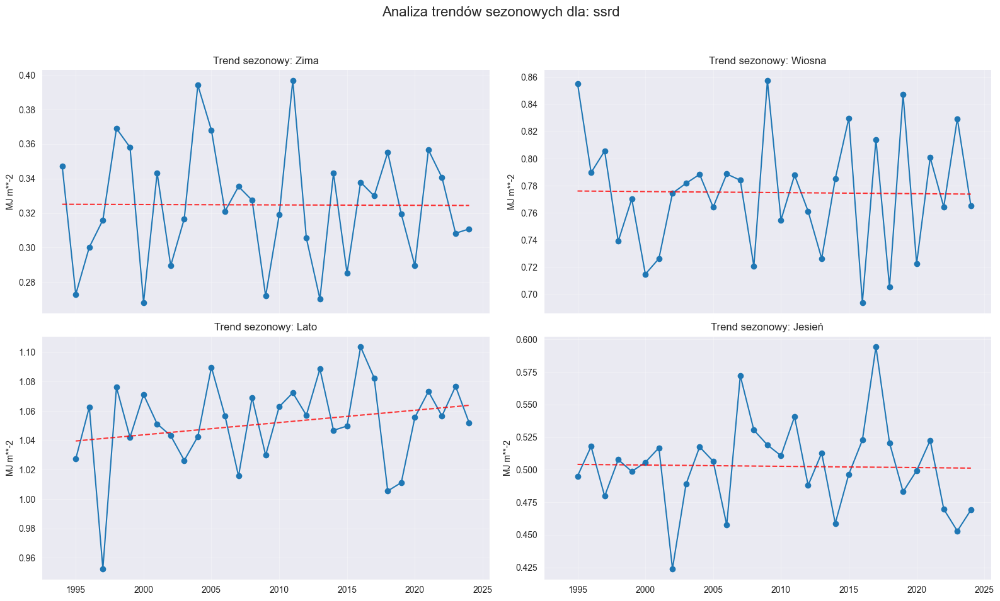

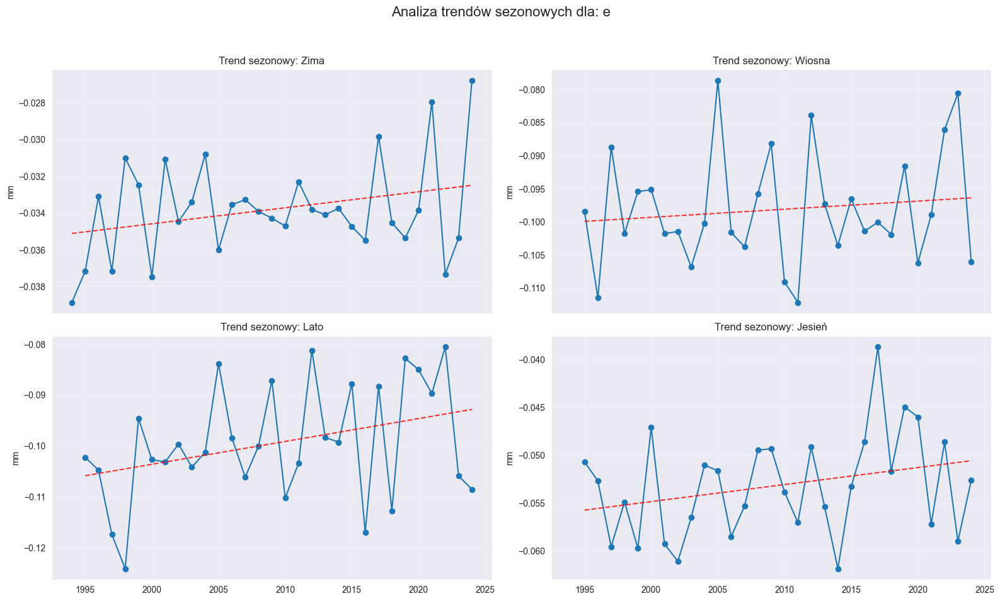

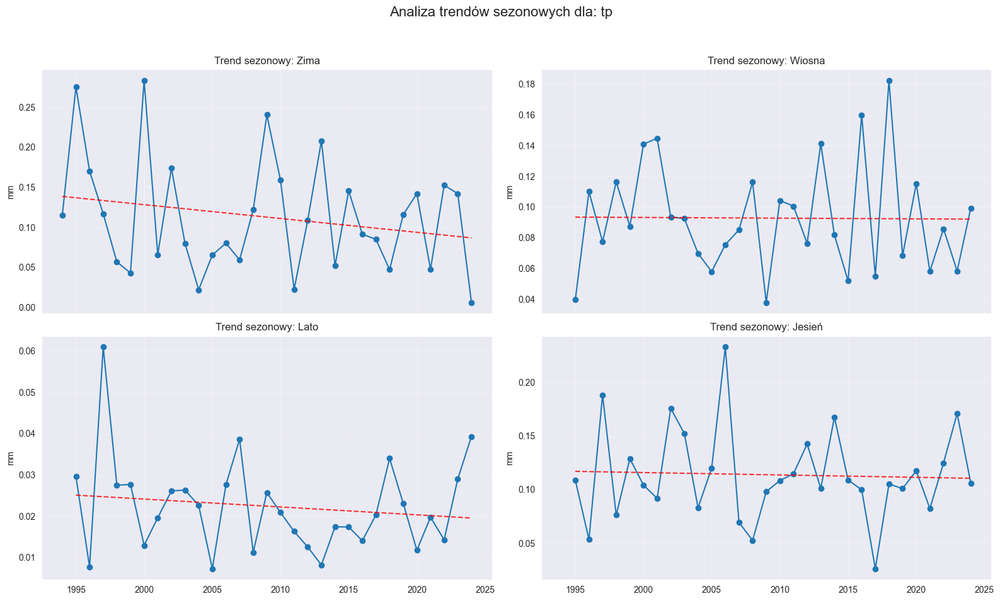

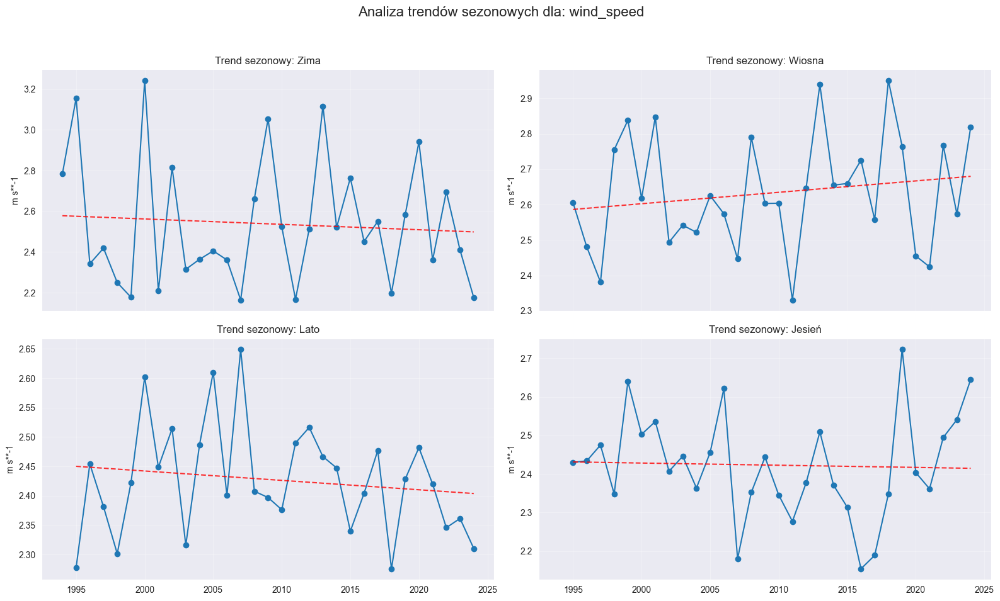

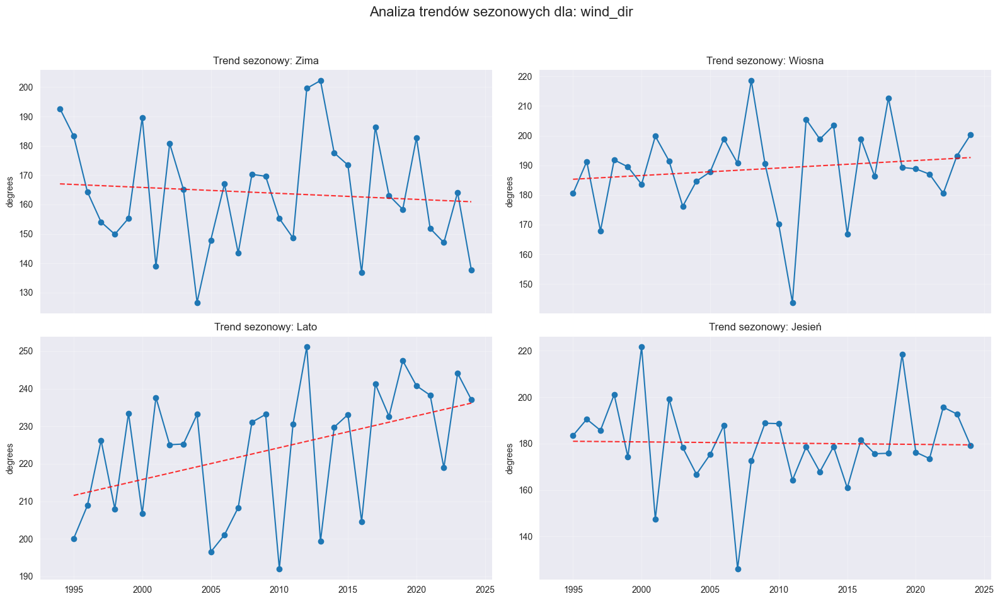

In [11]:
#Analizy sezonowe

def seasonal_trend(ds, var_name):
    ds_seasonal = ds.resample(time='QS-DEC').mean()
    
    seasons = {'DJF': 'Zima', 'MAM': 'Wiosna', 'JJA': 'Lato', 'SON': 'Jesień'}
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True)
    axes = axes.flatten()
    
    for i, (code, name) in enumerate(seasons.items()):
        data_season = ds_seasonal.sel(time=ds_seasonal.time.dt.season == code)
    
        axes[i].plot(data_season.time.dt.year, data_season[var_name], marker='o', linestyle='-', color='tab:blue')
        
        z = np.polyfit(data_season.time.dt.year, data_season[var_name], 1)
        p = np.poly1d(z)
        axes[i].plot(data_season.time.dt.year, p(data_season.time.dt.year), "r--", alpha=0.8, label='Trend')
        
        axes[i].set_title(f"Trend sezonowy: {name}")
        axes[i].grid(True, alpha=0.3)
        axes[i].set_ylabel(ds_final[var_name].attrs.get('units', ''))
    
    plt.suptitle(f"Analiza trendów sezonowych dla: {ds_final[var_name].attrs.get('short_name', var_name)}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(
        f"trendy_sezonowe{ds_final[var_name].attrs.get('short_name', var_name)}.jpg",
        dpi=300,
        facecolor="white",      
        bbox_inches="tight"
    )

    plt.show()

ds_spatial = ds_final.mean(dim=['latitude', 'longitude'])
for var in vars_to_plot:
    seasonal_trend(ds_spatial, var)

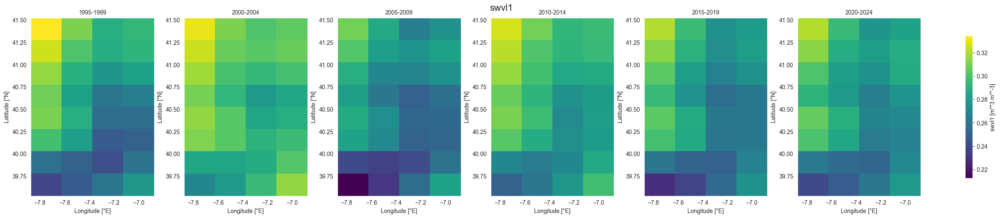

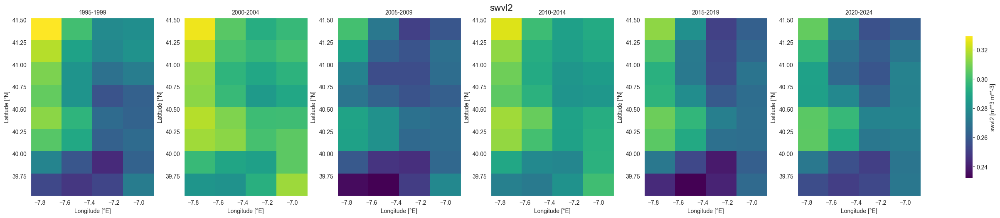

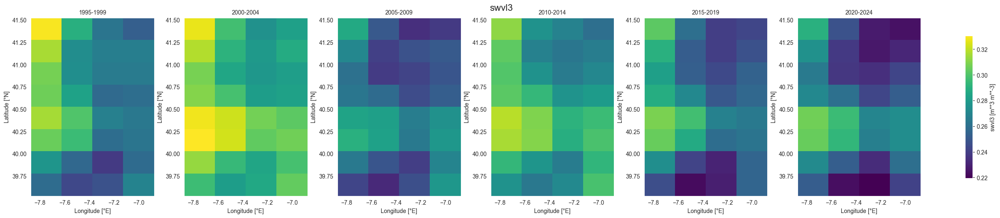

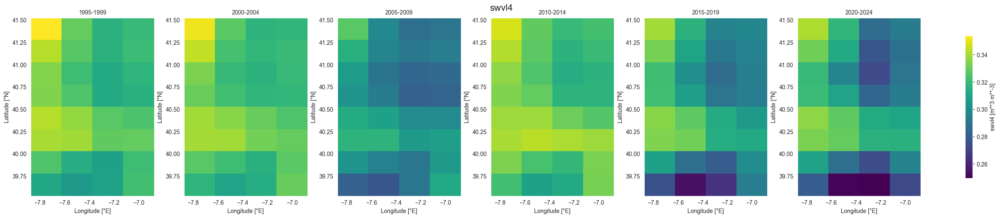

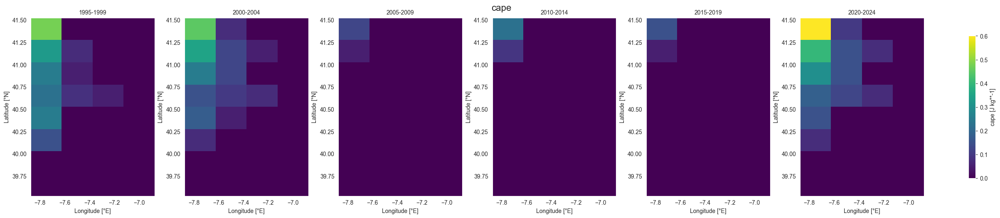

...

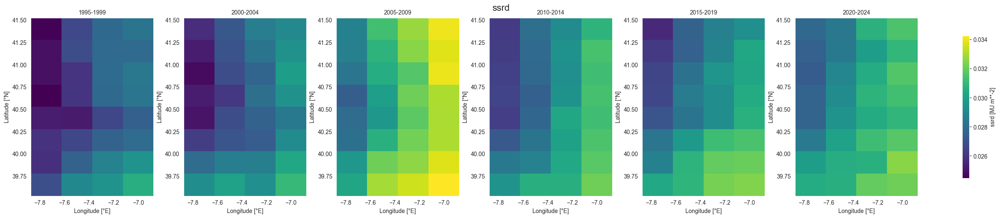

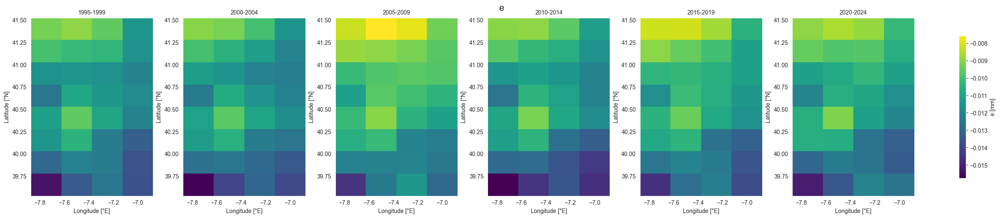

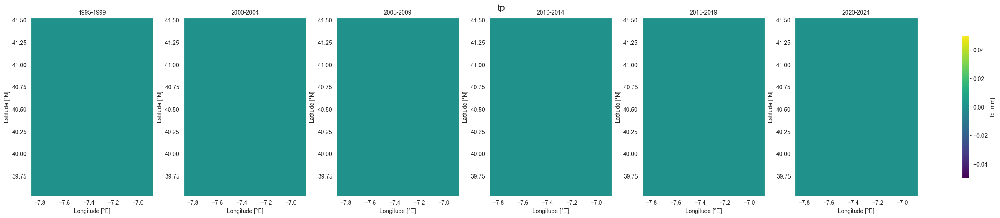

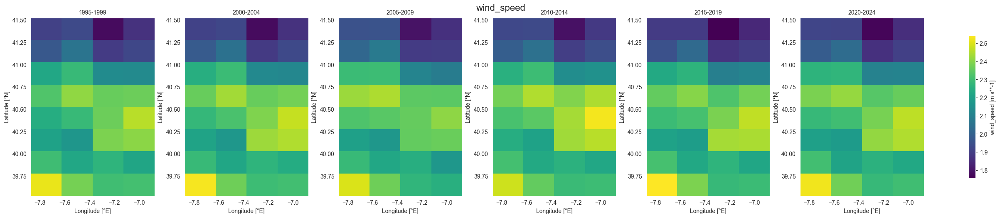

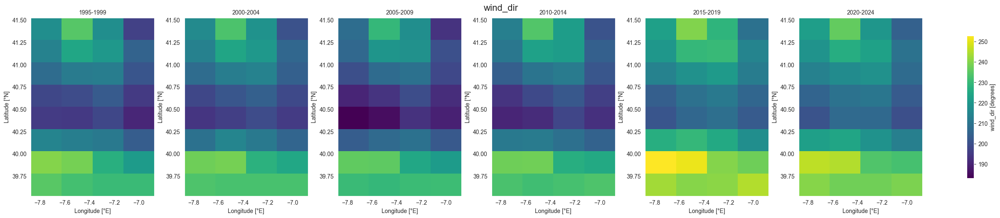

In [20]:
def time_place_analysis(ds_final, periods, step, end_year, var_name, save_dir=None):
    
    means = []
    labels = []
    
    for y in periods:
        y_end = min(y + step - 1, end_year)
        da = ds_final[var_name].sel(time=slice(str(y), str(y_end))).median(dim='time')
        means.append(da)
        labels.append(f"{y}-{y_end}")

    vmin = min(da.min().item() for da in means)
    vmax = max(da.max().item() for da in means)
    
    n = len(means)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 5), constrained_layout=True)
   
    fig.suptitle(f"{ds_final[var_name].attrs.get('short_name', var_name)}", fontsize=16, y=1.02)

    for ax, da, label in zip(axes, means, labels):
        im = da.plot(
            ax=ax,
            cmap='viridis',
            vmin=vmin,
            vmax=vmax,
            add_colorbar=False
        )
        ax.set_title(label, fontsize=10)
        ax.set_xlabel("Longitude [°E]") 
        ax.set_ylabel("Latitude [°N]")   

    cbar = fig.colorbar(im, ax=axes, orientation='vertical', shrink=0.8)
    units = ds_final[var_name].attrs.get('units', '')
    cbar.set_label(f"{var_name} [{units}]")
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{save_dir}/analiza_czasprzestrzen_mediana_{var_name}.png"
        fig.savefig(filename, dpi=300, bbox_inches='tight')
    
    plt.show()

start_year = 1995
end_year = 2024
step = 5
periods = list(range(start_year, end_year, step))

for var in vars_to_plot:
    time_place_analysis(ds_final, periods, step, end_year, var_name=var, save_dir="plots")


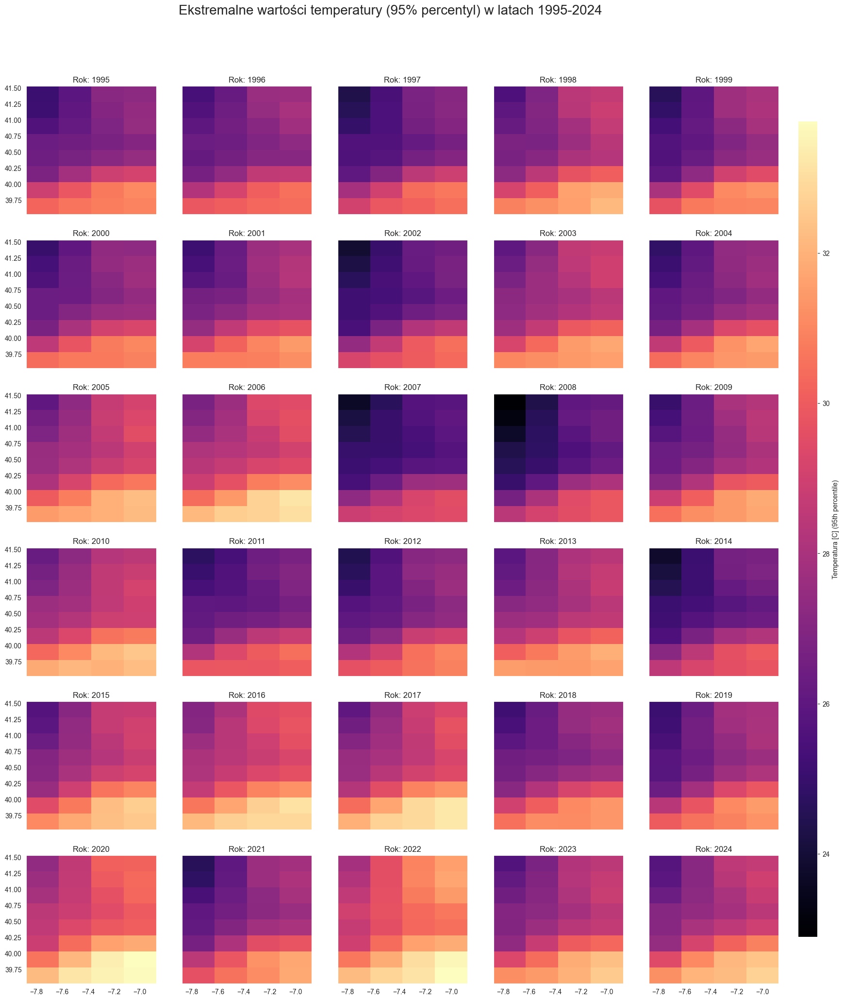

In [24]:
extreme_cape = ds_final['t2m'].groupby('time.year').quantile(0.95, dim='time')

fig, axes = plt.subplots(6, 5, figsize=(20, 24), sharex=True, sharey=True)
axes = axes.flatten()

vmax = float(extreme_cape.max())
vmin = float(extreme_cape.min())

for i, year in enumerate(extreme_cape.year.values):
    data_year = extreme_cape.sel(year=year)
    im = data_year.plot(
        ax=axes[i], 
        cmap='magma', 
        add_colorbar=False, 
        vmin=vmin, 
        vmax=vmax
    )
    
    axes[i].set_title(f"Rok: {year}", fontsize=12)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, label='Temperatura [C] (95th percentile)')

plt.suptitle("Ekstremalne wartości temperatury (95% percentyl) w latach 1995-2024", fontsize=20, y=0.95)
save_dir="plots"
if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{save_dir}/maksima_temp.png"
        fig.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

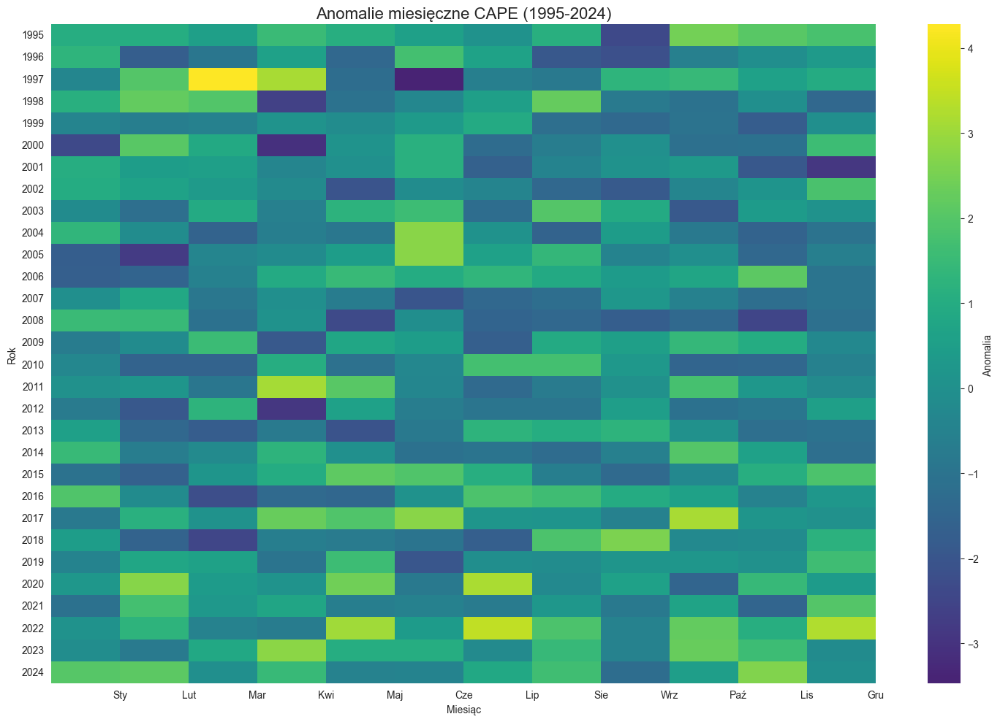

In [23]:
ds_m = ds_final['t2m'].mean(dim=['latitude', 'longitude']).resample(time='1MS').mean()

climatology = ds_m.groupby('time.month').median('time')
anomalies = ds_m.groupby('time.month') - climatology

df_anom = anomalies.to_dataframe(name='anomalia').reset_index()
df_anom['year'] = df_anom['time'].dt.year
df_anom['month'] = df_anom['time'].dt.month
pivot_anom = df_anom.pivot(index='year', columns='month', values='anomalia')

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))
sns.heatmap(pivot_anom, cmap='viridis', center=0, annot=False, 
            cbar_kws={'label': 'Anomalia '})

plt.title('Anomalie miesięczne CAPE (1995-2024)', fontsize=16)
plt.xlabel('Miesiąc')
plt.ylabel('Rok')
plt.xticks(range(1, 13), ['Sty', 'Lut', 'Mar', 'Kwi', 'Maj', 'Cze', 'Lip', 'Sie', 'Wrz', 'Paź', 'Lis', 'Gru'])
plt.tight_layout()
plt.show()

C:\Users\bagaw\anaconda3\envs\climat_project\Lib\site-packages\sklearn\cluster\_kmeans.py:1425: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


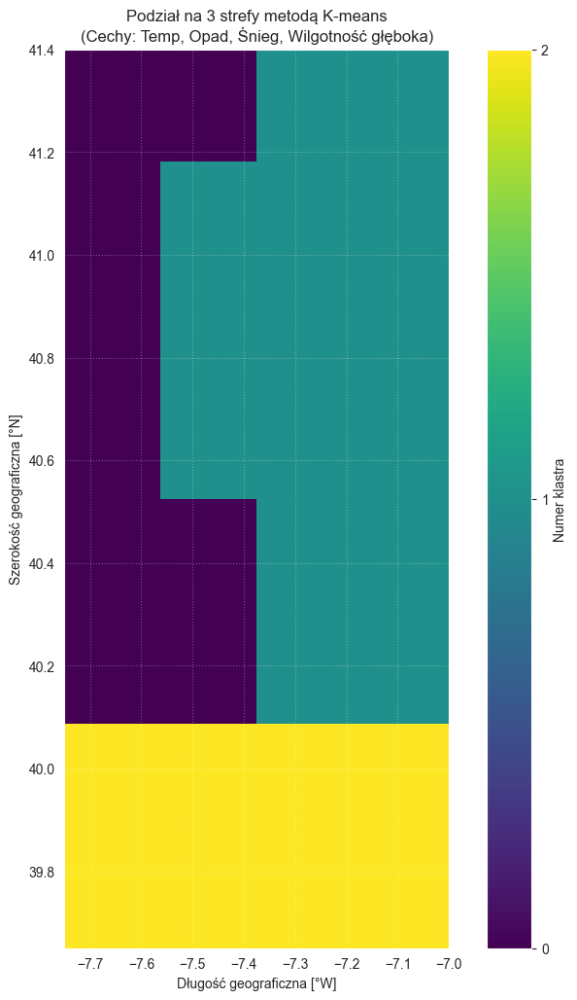

<xarray.DataArray 'cluster' (latitude: 8, longitude: 4)> Size: 128B
array([[0, 0, 1, 1],
       [0, 1, 1, 1],
       [0, 1, 1, 1],
       [0, 1, 1, 1],
       [0, 0, 1, 1],
       [0, 0, 1, 1],
       [2, 2, 2, 2],
       [2, 2, 2, 2]], dtype=int32)
Coordinates:
  * latitude   (latitude) float64 64B 41.4 41.15 40.9 40.65 ... 40.15 39.9 39.65
  * longitude  (longitude) float64 32B -7.75 -7.5 -7.25 -7.0


In [37]:
features_ds = ds_final[['t2m', 'tp', 'swvl4', 'sf']].mean(dim='time')
df_kmeans = features_ds.to_dataframe().reset_index()

X = df_kmeans[['t2m', 'tp','swvl4', 'sf']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df_kmeans['cluster'] = kmeans.fit_predict(X_scaled)

lats = np.sort(df_kmeans['latitude'].unique())
lons = np.sort(df_kmeans['longitude'].unique())
cluster_grid = df_kmeans.pivot(index='latitude', columns='longitude', values='cluster')
cluster_grid = cluster_grid.loc[lats[::-1], lons]  
plt.figure(figsize=(10, 12))
plt.imshow(cluster_grid.values, extent=[lons.min(), lons.max(), lats.min(), lats.max()], 
           cmap='viridis', origin='upper')

plt.title("Podział na 3 strefy metodą K-means\n(Cechy: Temp, Opad, Śnieg, Wilgotność głęboka)")
plt.xlabel("Długość geograficzna [°W]")
plt.ylabel("Szerokość geograficzna [°N]")
plt.colorbar(ticks=[0, 1, 2], label='Numer klastra')
plt.grid(True, linestyle=':', alpha=0.3)
save_dir="plots"
if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{save_dir}/klastry.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

ds_clusters = df_kmeans.set_index(['latitude', 'longitude'])['cluster'].to_xarray()

ds_final['cluster'] = ds_clusters

print(ds_final.cluster)

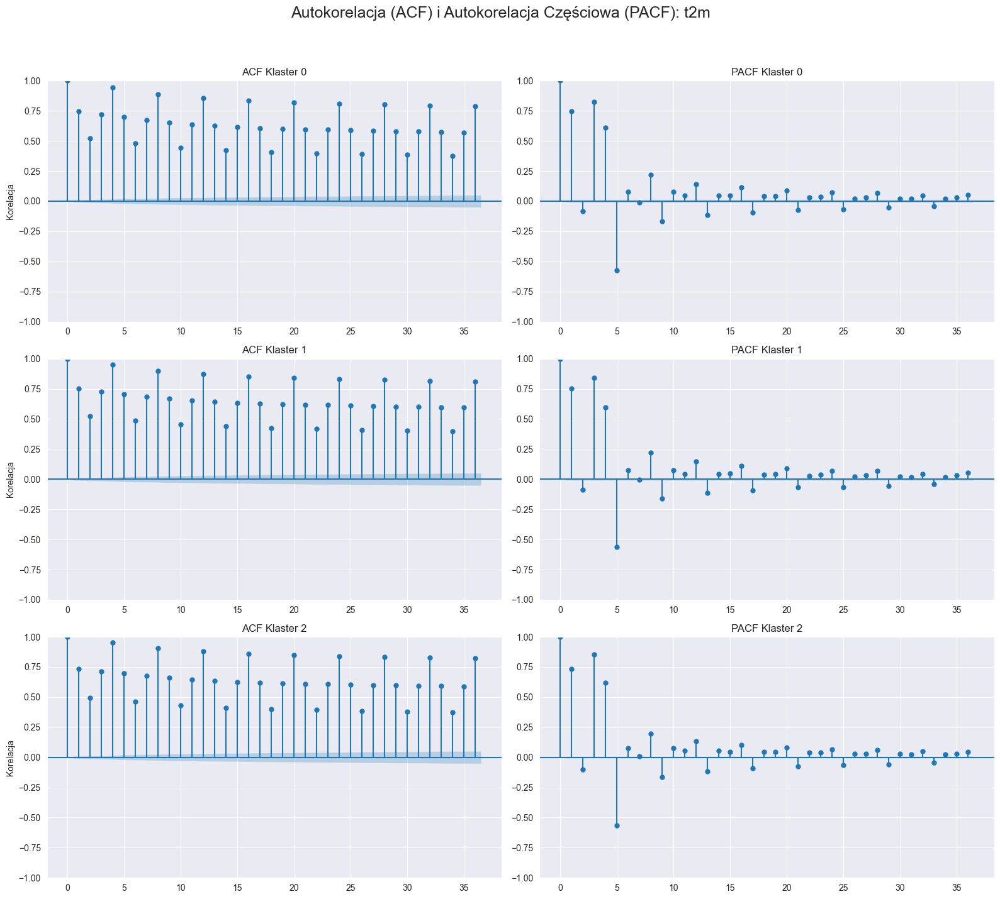

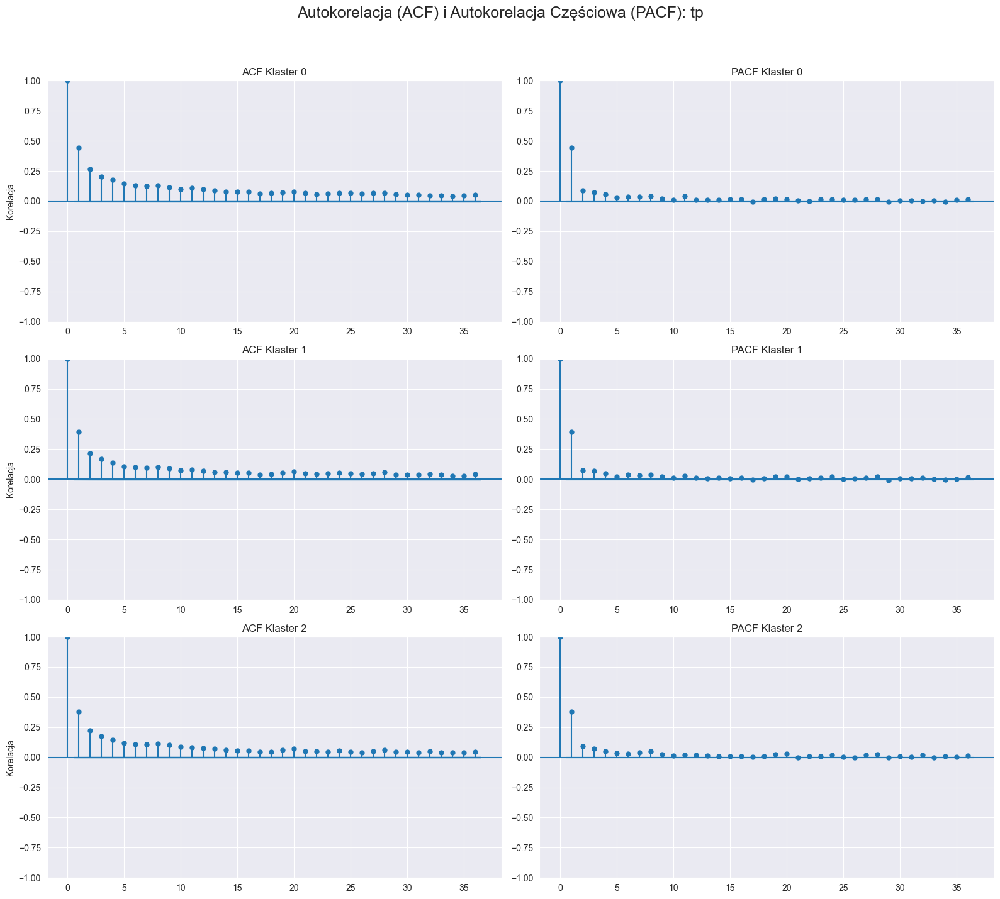

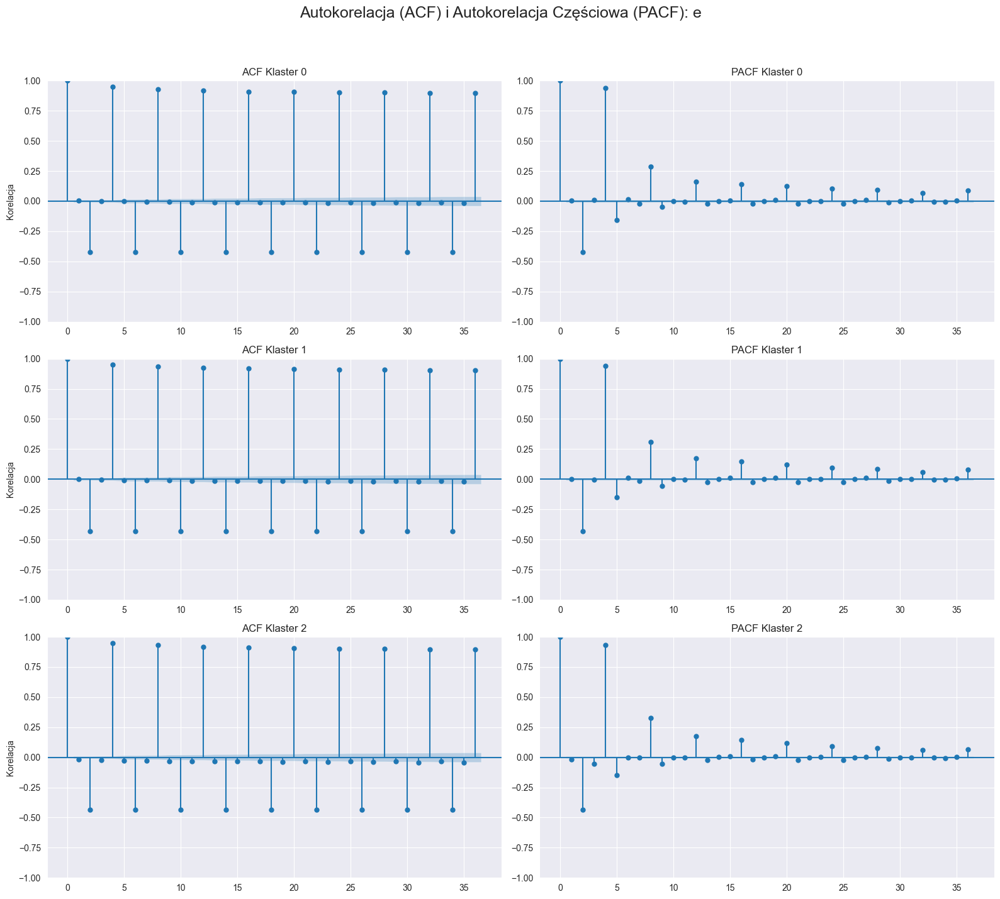

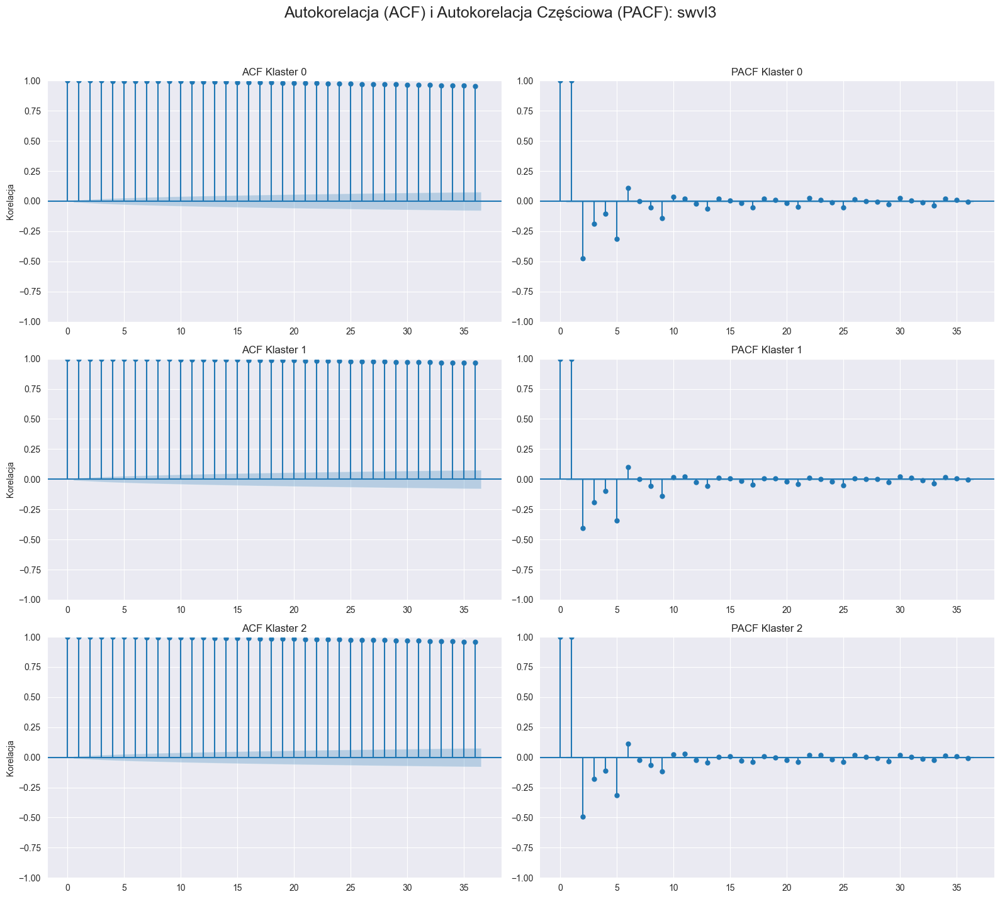

In [43]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_autocorrelation_by_cluster(ds, vars_to_analyze):
    clusters = [0, 1, 2]
    
    for var in vars_to_analyze:
        if var not in ds.variables:
            print(f"Pominięto {var}: brak w zbiorze danych.")
            continue
            
        fig, axes = plt.subplots(3, 2, figsize=(16, 15))
        fig.suptitle(f"Autokorelacja (ACF) i Autokorelacja Częściowa (PACF): {var}", fontsize=18)
        
        for cluster_id in clusters:
            series = ds[var].where(ds.cluster == cluster_id, drop=True).mean(dim=['latitude', 'longitude']).to_series()
            series = series.dropna()
            
            plot_acf(series, ax=axes[cluster_id, 0], lags=36, title=f"ACF Klaster {cluster_id}")
            axes[cluster_id, 0].set_ylabel("Korelacja")
            
            plot_pacf(series, ax=axes[cluster_id, 1], lags=36, title=f"PACF Klaster {cluster_id}", method='ywm')
            
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.savefig(f"acf_pacf_{var}.png", dpi=300)
        plt.show()

vars_to_acf = ['t2m', 'tp', 'e', 'swvl3']

plot_autocorrelation_by_cluster(ds_final, vars_to_acf)

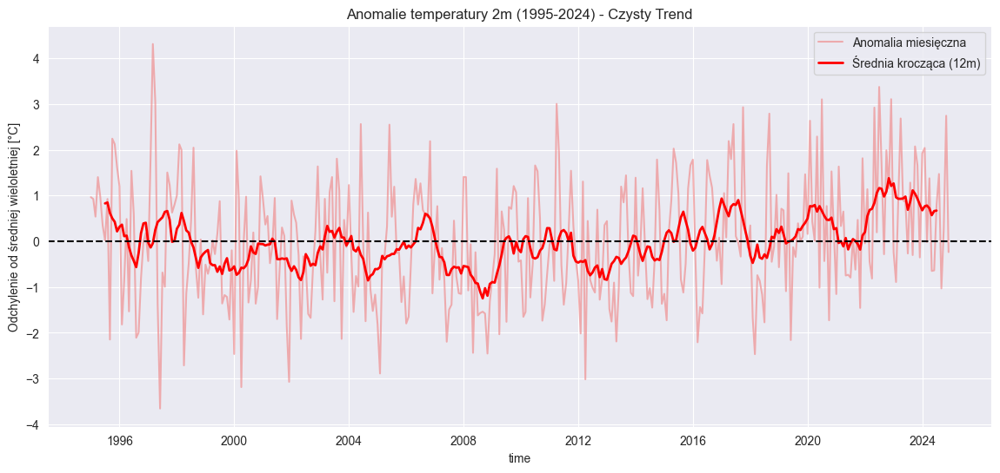

In [74]:
ds_monthly = ds_final['t2m'].mean(dim=['latitude', 'longitude']).resample(time='1MS').mean()
climatology = ds_monthly.groupby('time.month').mean('time')
anomalies = ds_monthly.groupby('time.month') - climatology
plt.figure(figsize=(14, 6))
anomalies.plot(label='Anomalia miesięczna', color='lightcoral', alpha=0.6)

anomalies.rolling(time=12, center=True).mean().plot(label='Średnia krocząca (12m)', color='red', linewidth=2)

plt.axhline(0, color='black', linestyle='--')
plt.title("Anomalie temperatury 2m (1995-2024) - Czysty Trend")
plt.ylabel("Odchylenie od średniej wieloletniej [°C]")
plt.legend()
plt.show()

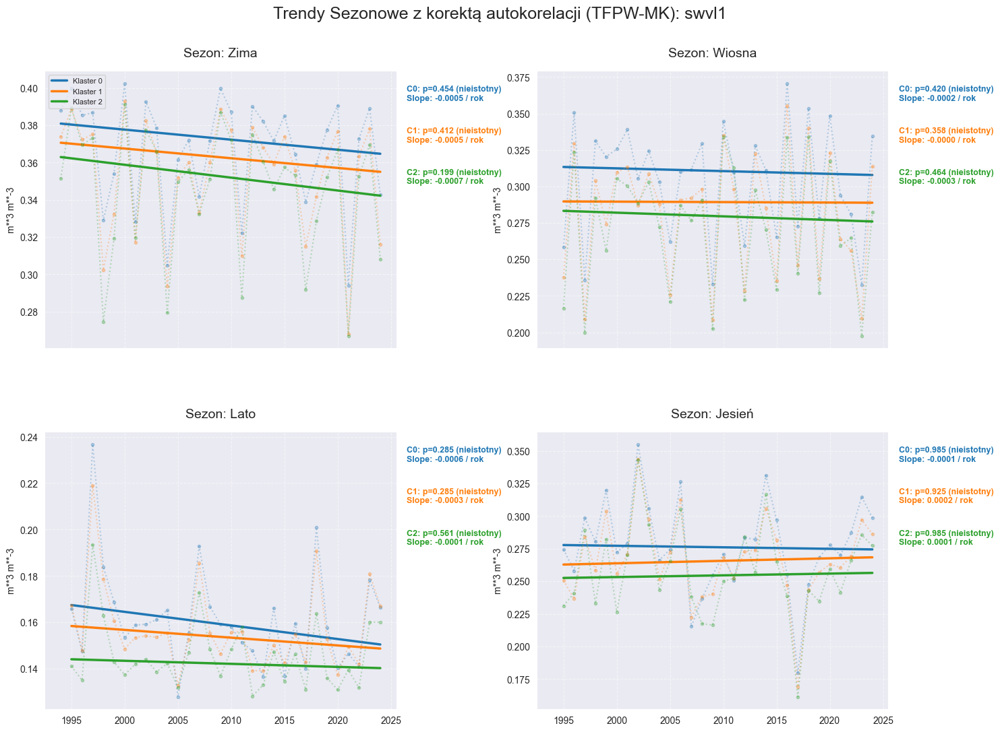

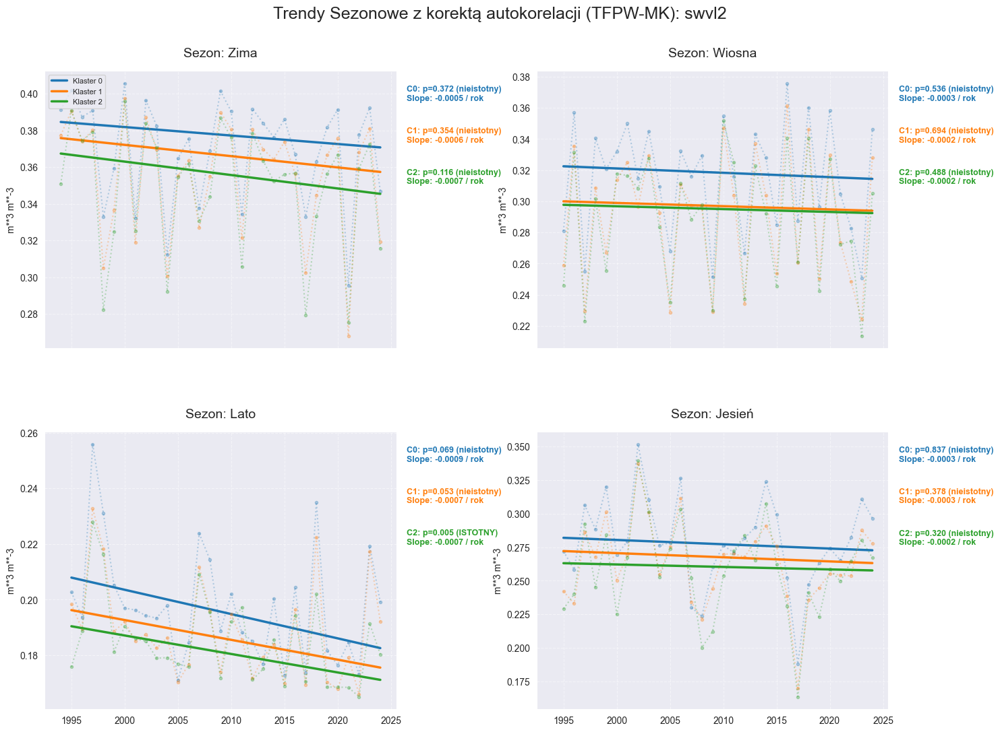

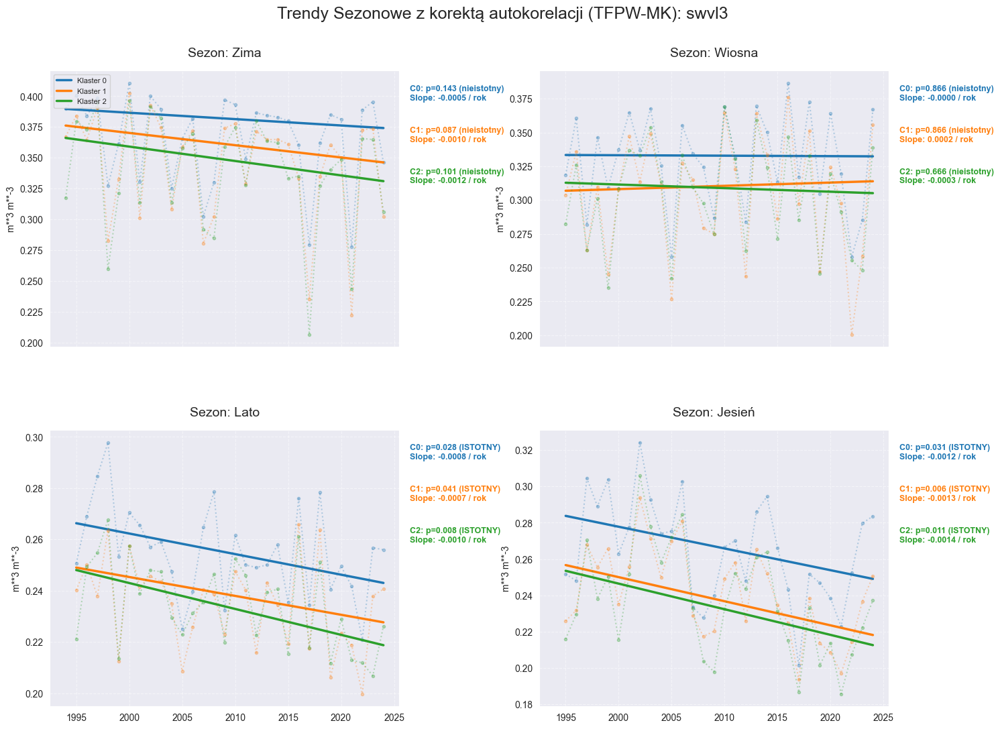

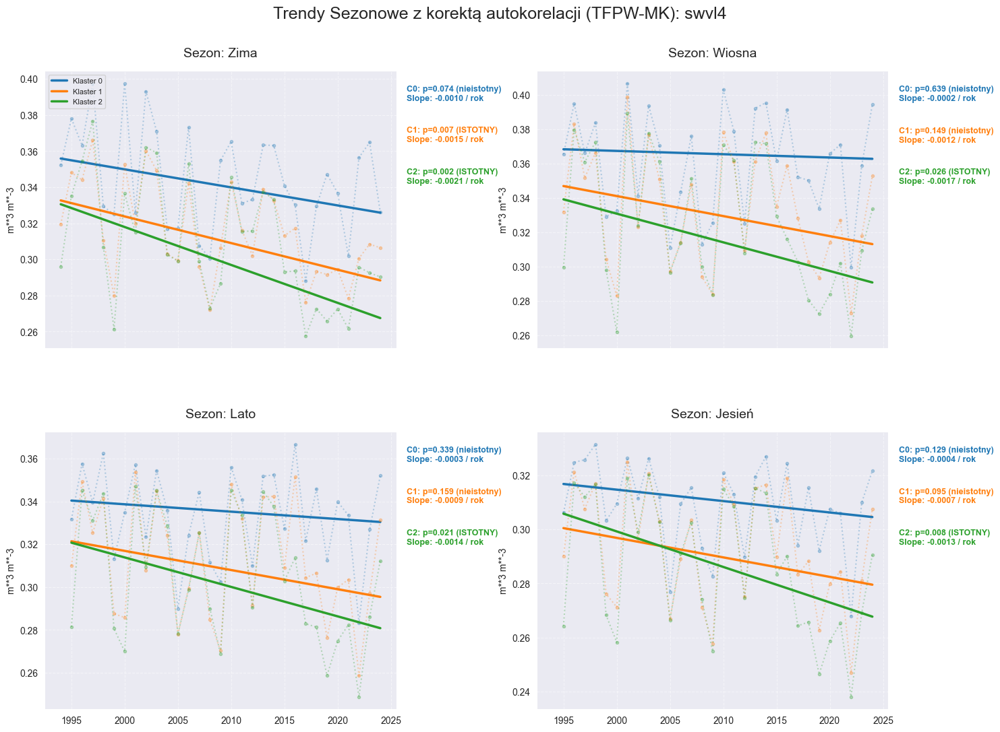

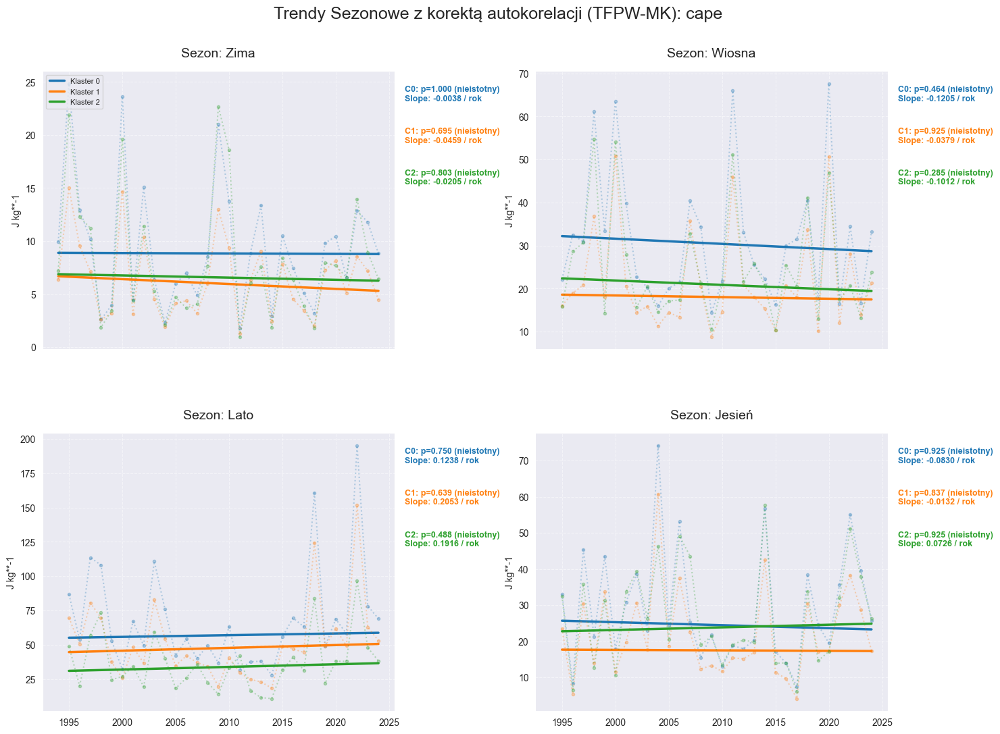

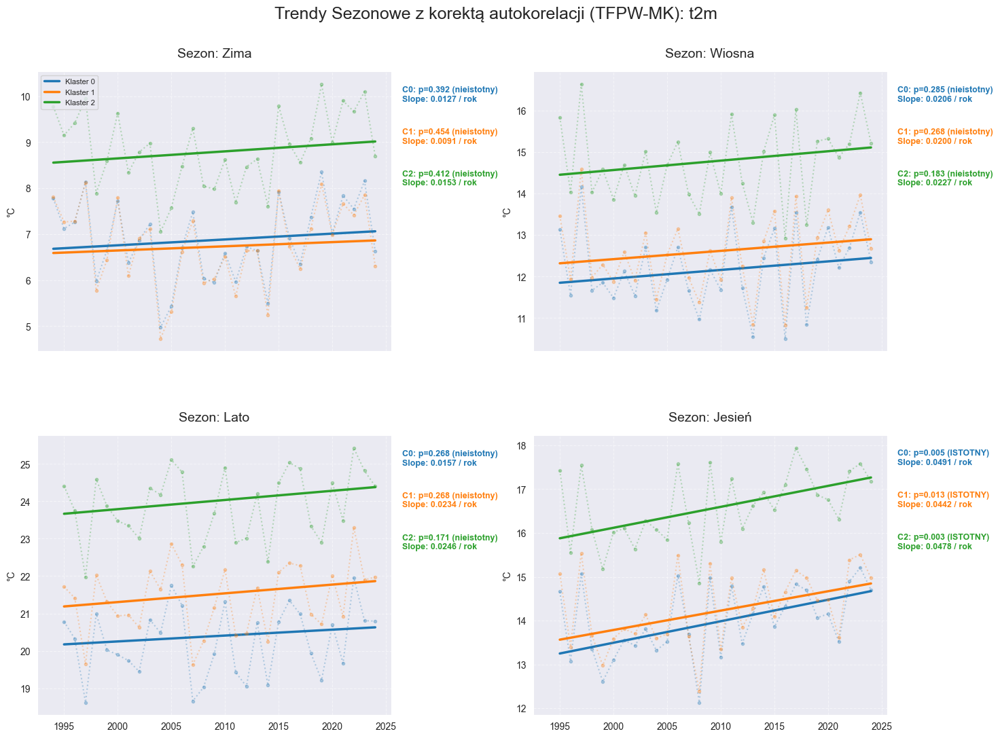

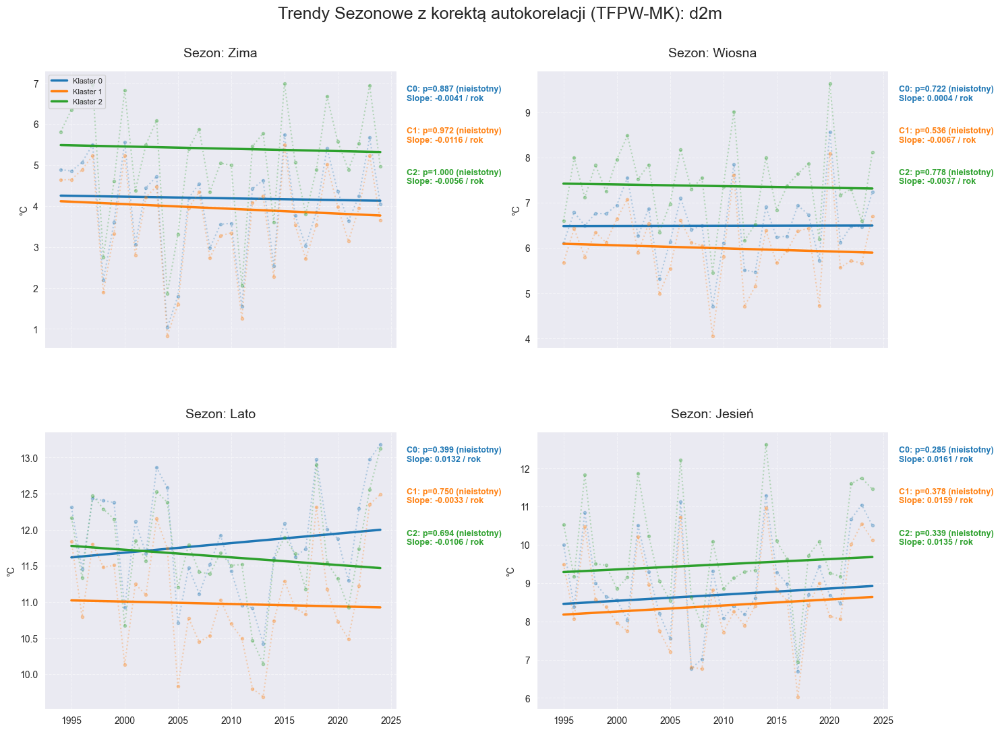

C:\Users\bagaw\anaconda3\envs\climat_project\Lib\site-packages\pymannkendall\pymannkendall.py:60: RuntimeWarning: invalid value encountered in divide
  return acov[:nlags+1]/acov[0]
C:\Users\bagaw\anaconda3\envs\climat_project\Lib\site-packages\pymannkendall\pymannkendall.py:60: RuntimeWarning: invalid value encountered in divide
  return acov[:nlags+1]/acov[0]
C:\Users\bagaw\anaconda3\envs\climat_project\Lib\site-packages\pymannkendall\pymannkendall.py:60: RuntimeWarning: invalid value encountered in divide
  return acov[:nlags+1]/acov[0]


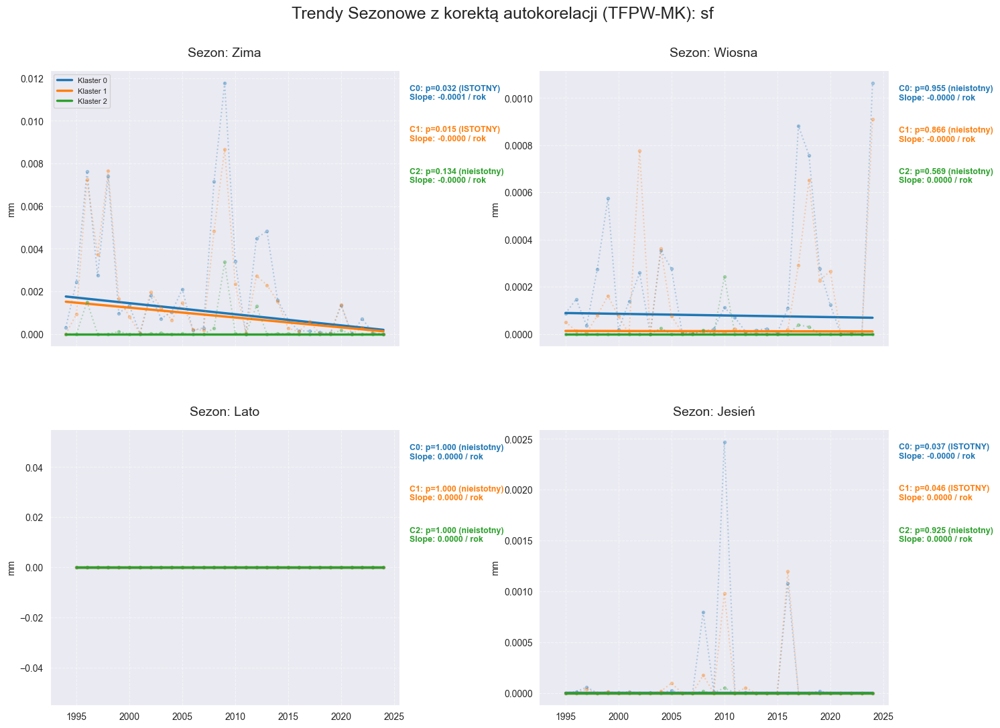

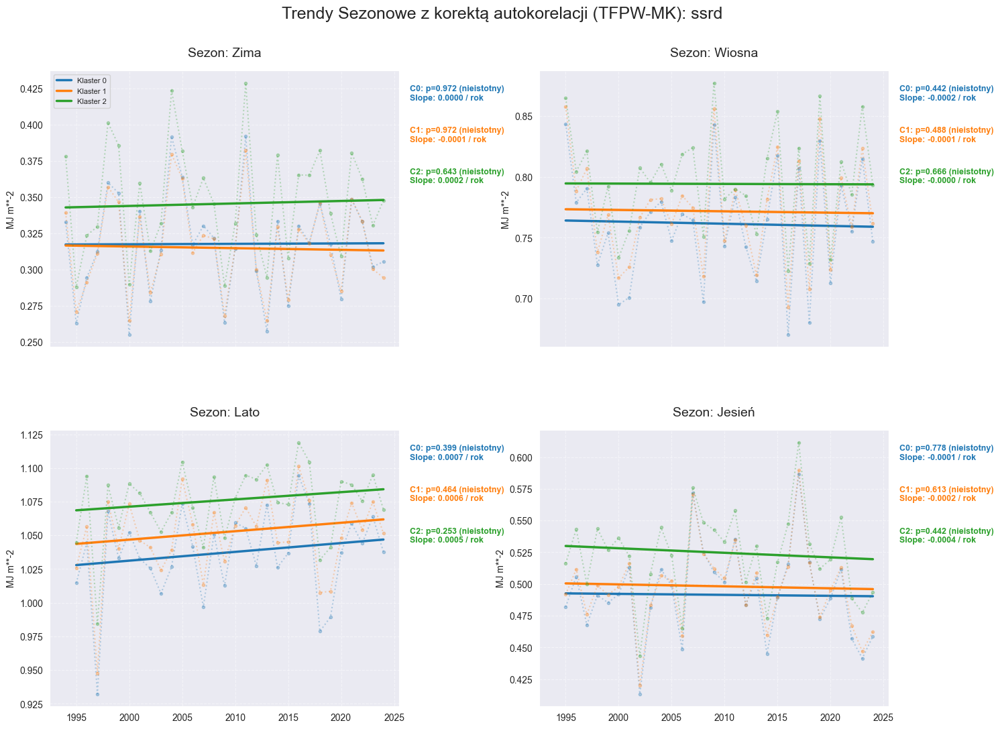

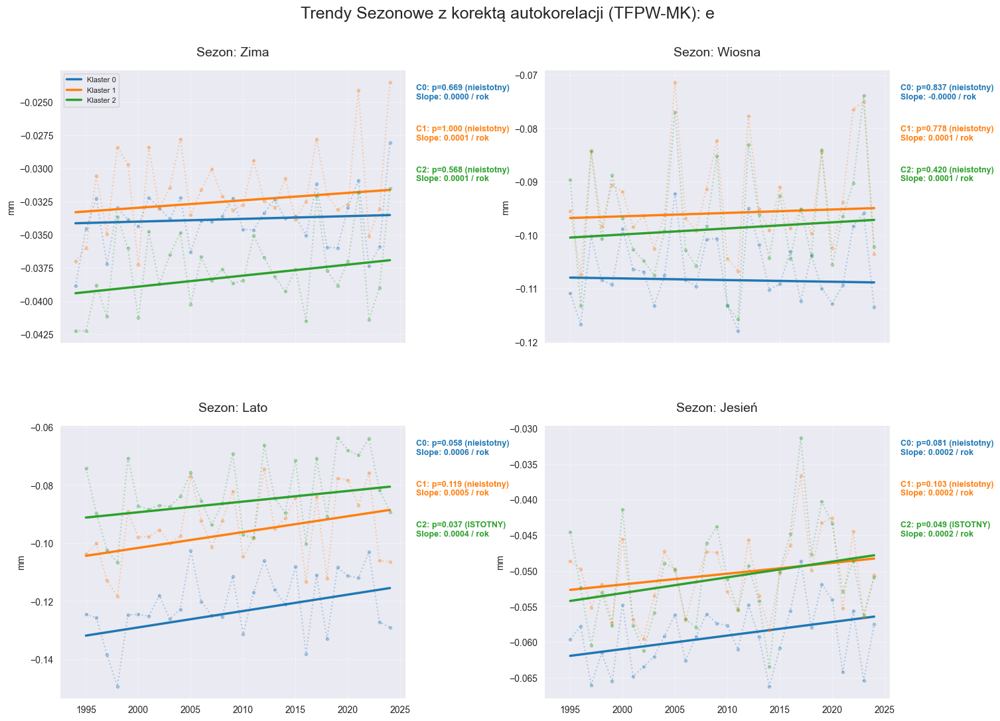

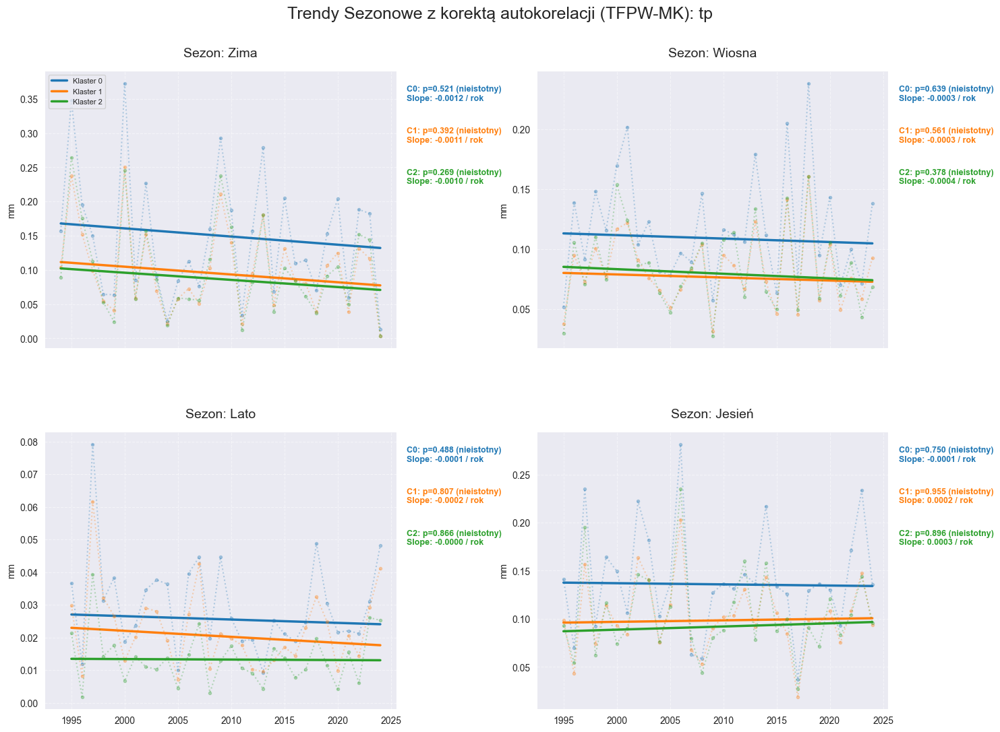

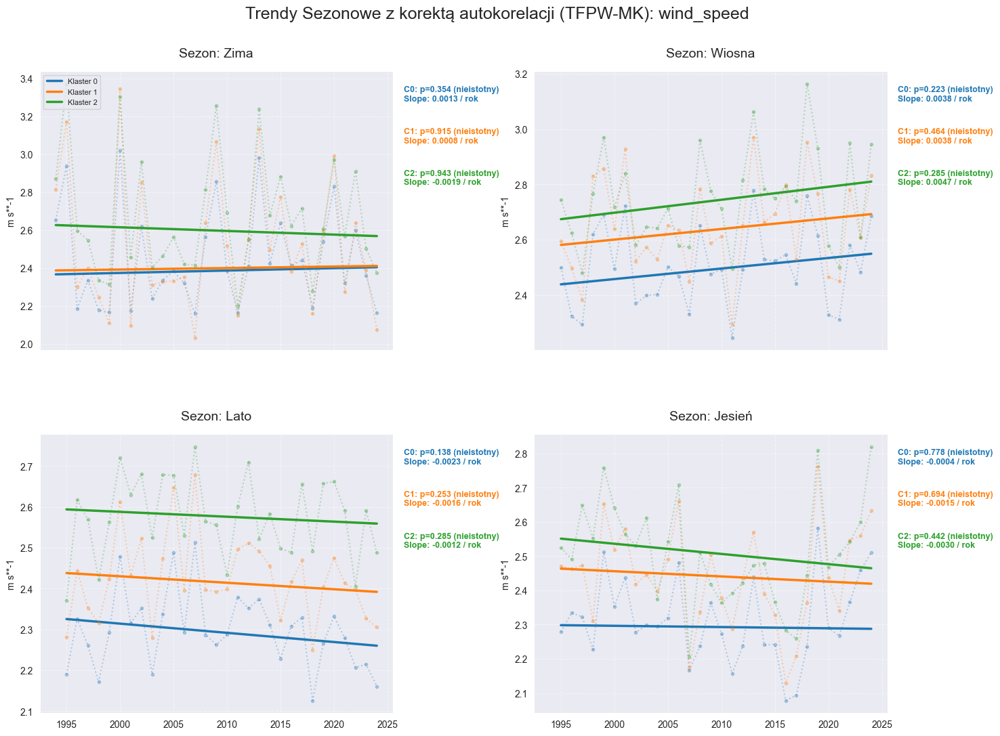

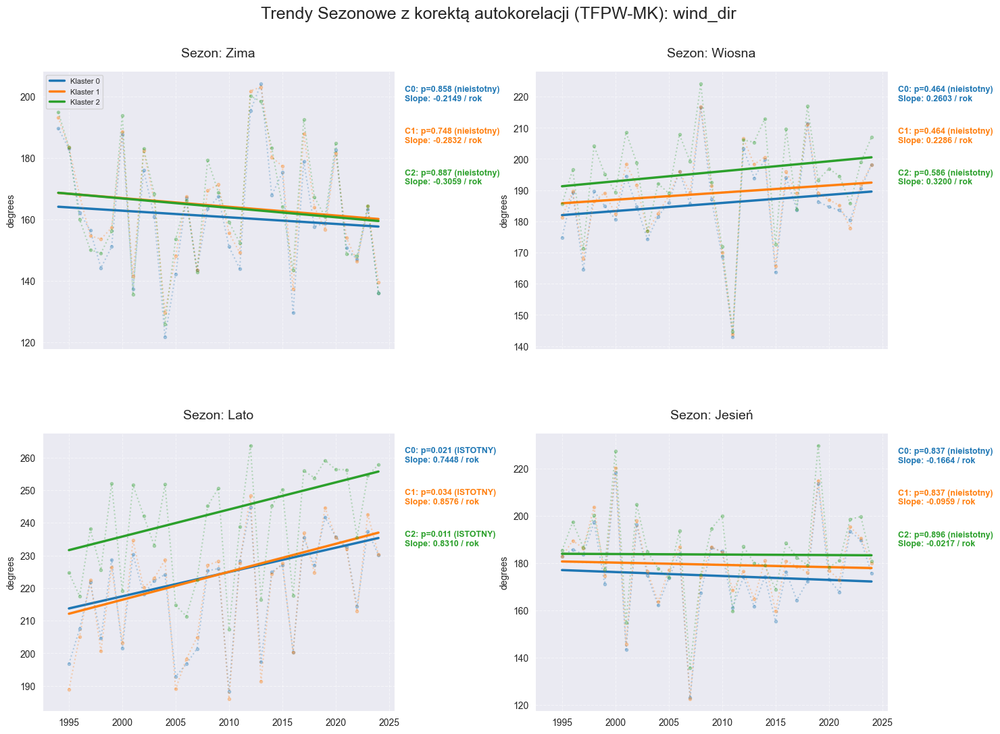

In [42]:
def seasonal_trend_pancerny(ds, var_name):
    ds_seasonal = ds.resample(time='QS-DEC').mean()
    seasons = {'DJF': 'Zima', 'MAM': 'Wiosna', 'JJA': 'Lato', 'SON': 'Jesień'}
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c'] 
    
    fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharex=True)
    axes = axes.flatten()
    
    for i, (code, name) in enumerate(seasons.items()):
        ax = axes[i]
        data_season_all = ds_seasonal.sel(time=ds_seasonal.time.dt.season == code)
        
        for cluster_id in range(3):
            cluster_data = data_season_all.where(ds_seasonal.cluster == cluster_id, drop=True)
            y_series = cluster_data[var_name].mean(dim=['latitude', 'longitude']).values
            x_years = cluster_data.time.dt.year.values
            
            mask = ~np.isnan(y_series)
            x_clean, y_clean = x_years[mask], y_series[mask]

            if len(y_clean) > 2: 
                # funkcja usuwa autokorelację przed testem trendu
                res = mk.trend_free_pre_whitening_modification_test(y_clean)
                
                ax.plot(x_clean, y_clean, marker='.', linestyle=':', color=colors[cluster_id], alpha=0.3)
                trend_line = res.slope * (x_clean - x_clean[0]) + res.intercept
                ax.plot(x_clean, trend_line, color=colors[cluster_id], linewidth=2.5, 
                        label=f'Klaster {cluster_id}')
                
                sig_star = " (ISTOTNY)" if res.p < 0.05 else " (nieistotny)"
                stats_line = (f"C{cluster_id}: p={res.p:.3f}{sig_star}\n"
                              f"Slope: {res.slope:.4f} / rok")
                
                ax.text(1.03, 0.95 - (cluster_id * 0.15), stats_line, 
                        transform=ax.transAxes, color=colors[cluster_id], 
                        fontsize=9, fontweight='bold', va='top')

        ax.set_title(f"Sezon: {name}", fontsize=14, pad=15)
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.set_ylabel(ds[var_name].attrs.get('units', ''))
        if i == 0: ax.legend(loc='upper left', fontsize=8, frameon=True)

    short_name = ds[var_name].attrs.get('short_name', var_name)
    plt.suptitle(f"Trendy Sezonowe z korektą autokorelacji (TFPW-MK): {short_name}", 
                 fontsize=18, y=0.98)
    
    plt.subplots_adjust(right=0.82, top=0.90, hspace=0.3, wspace=0.4)
    
    plt.savefig(f"trendy_final_{short_name}.png", dpi=300, bbox_inches="tight")
    plt.show()

# Użycie
for var in vars_to_plot:
    seasonal_trend_pancerny(ds_final, var)

In [45]:
# korelacja
df_corr = ds_final.groupby['cluster'].mean(dim=['latitude', 'longitude']).to_dataframe().corr(method='spearman')
plt.figure(figsize=(12, 10))
sns.heatmap(df_corr, annot=True, cmap='viridis', center=0)
plt.title("Macierz wartości współczynnika korelacji Spearmana między zmiennymi w latach (1995-2024)")
plt.savefig(f"korelacje.png", dpi=300, bbox_inches="tight")
plt.show()

TypeError: 'method' object is not subscriptable

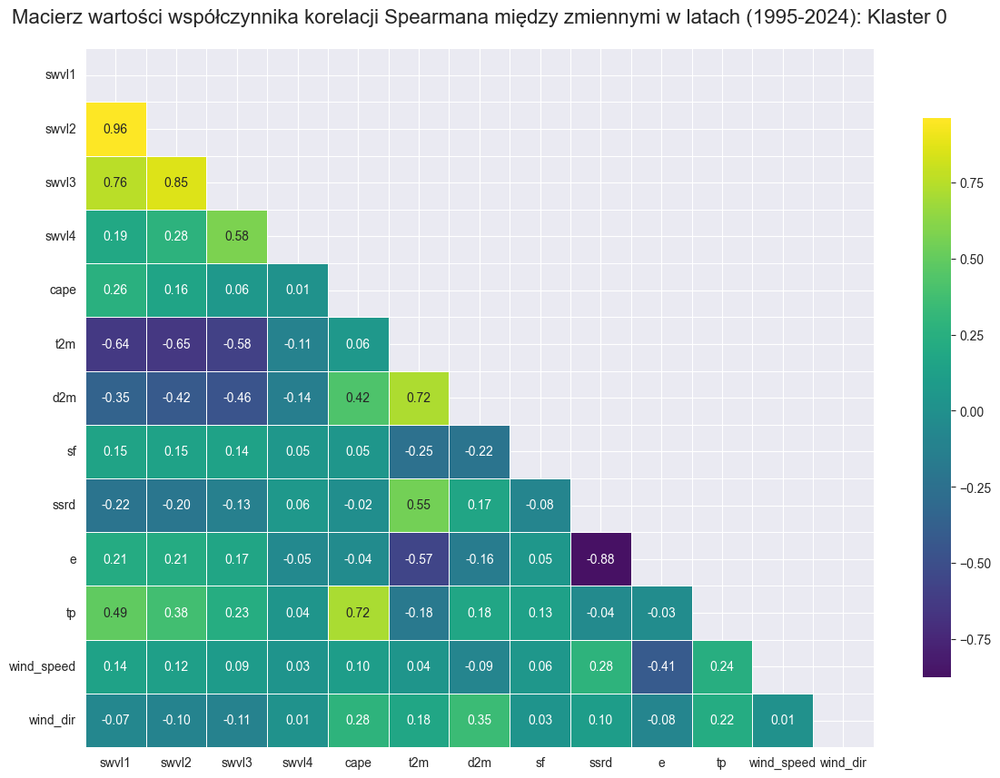

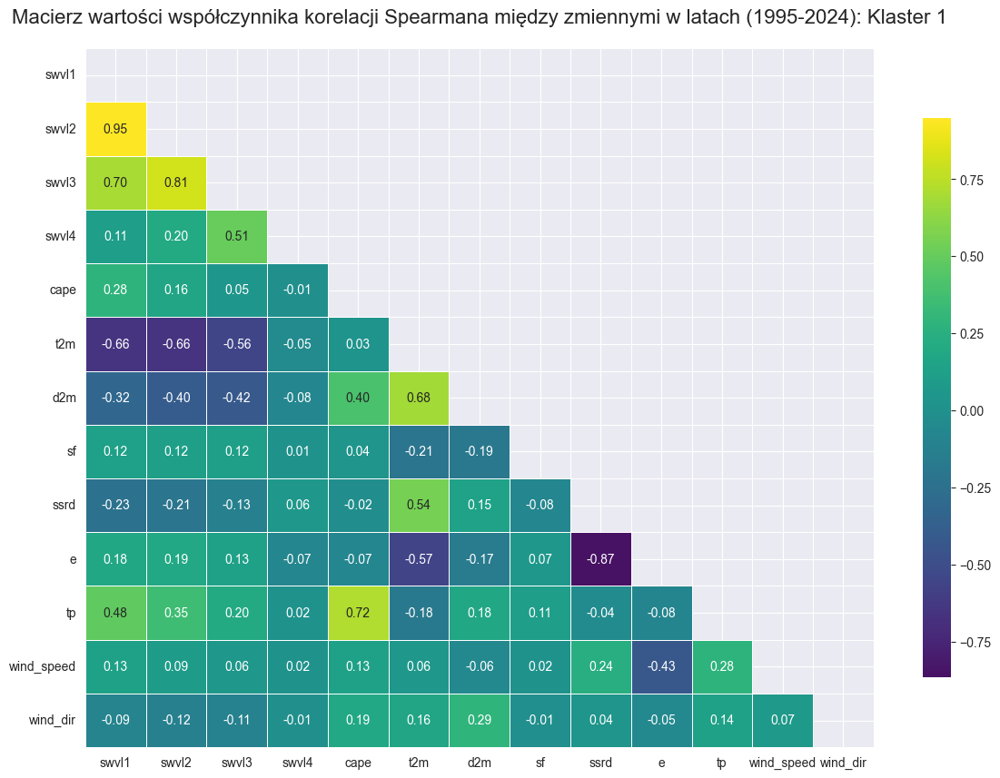

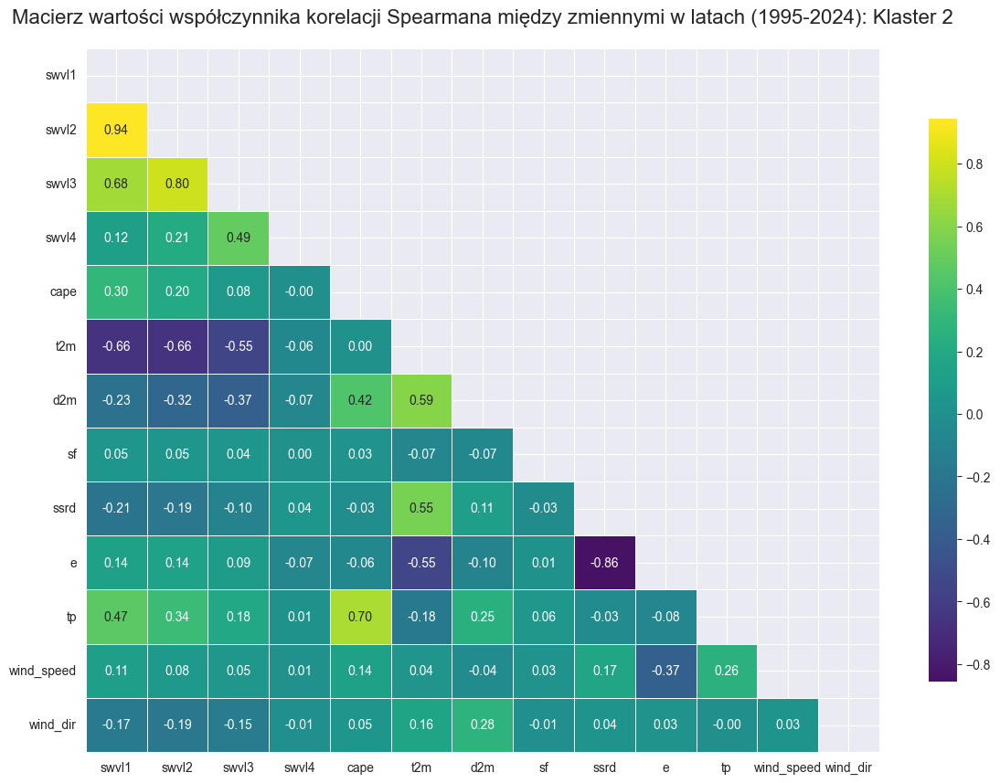

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_correlations_by_cluster(ds):
    clusters = sorted(np.unique(ds.cluster.values))
    vars_to_corr = [v for v in ds.data_vars if v != 'cluster']

    for cluster_id in clusters:
        ds_cluster = ds.where(ds.cluster == cluster_id, drop=True)
        df_cluster = ds_cluster[vars_to_corr].mean(dim=['latitude', 'longitude']).to_dataframe()
        
        df_corr = df_cluster.corr(method='spearman')
        
        plt.figure(figsize=(14, 10))
        mask = np.triu(np.ones_like(df_corr, dtype=bool))
        
        sns.heatmap(df_corr, 
                    mask=mask,
                    annot=True, 
                    fmt=".2f",
                    cmap='viridis', 
                    center=0,
                    linewidths=.5,
                    cbar_kws={"shrink": .8})
        
        plt.title(f"Macierz wartości współczynnika korelacji Spearmana między zmiennymi w latach (1995-2024): Klaster {cluster_id}", fontsize=16, pad=20)

        plt.savefig(f"korelacje_klaster_{cluster_id}.png", dpi=300, bbox_inches="tight")
        plt.show()

plot_correlations_by_cluster(ds_final)

Przetwarzanie danych z agregacją: Miesięczna...


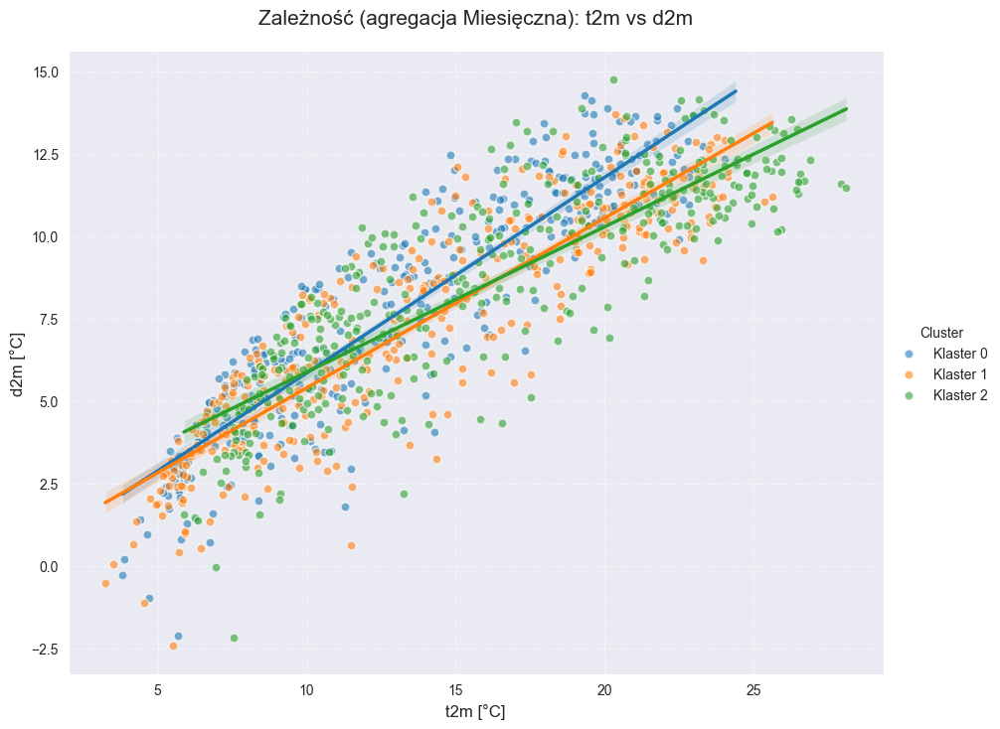

Przetwarzanie danych z agregacją: Miesięczna...


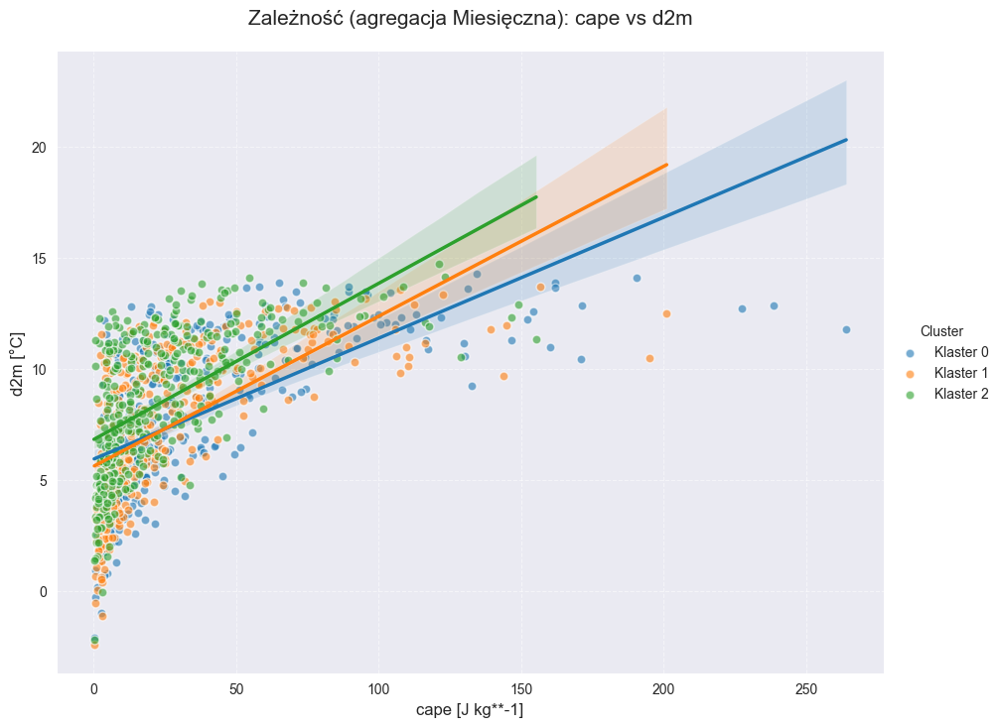

Przetwarzanie danych z agregacją: Miesięczna...


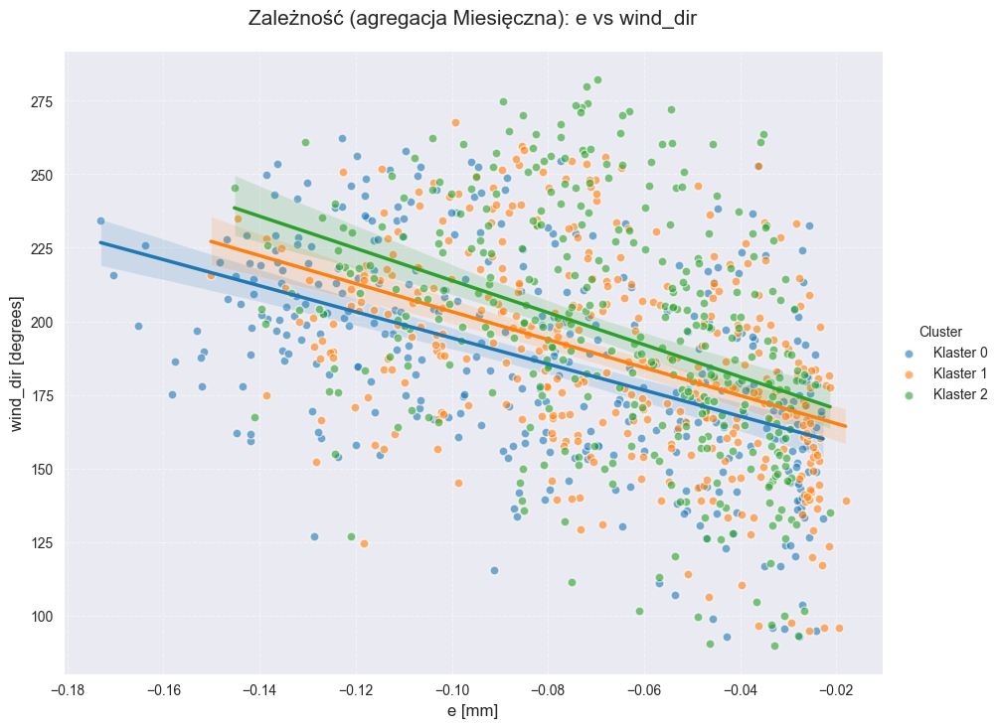

Przetwarzanie danych z agregacją: Miesięczna...


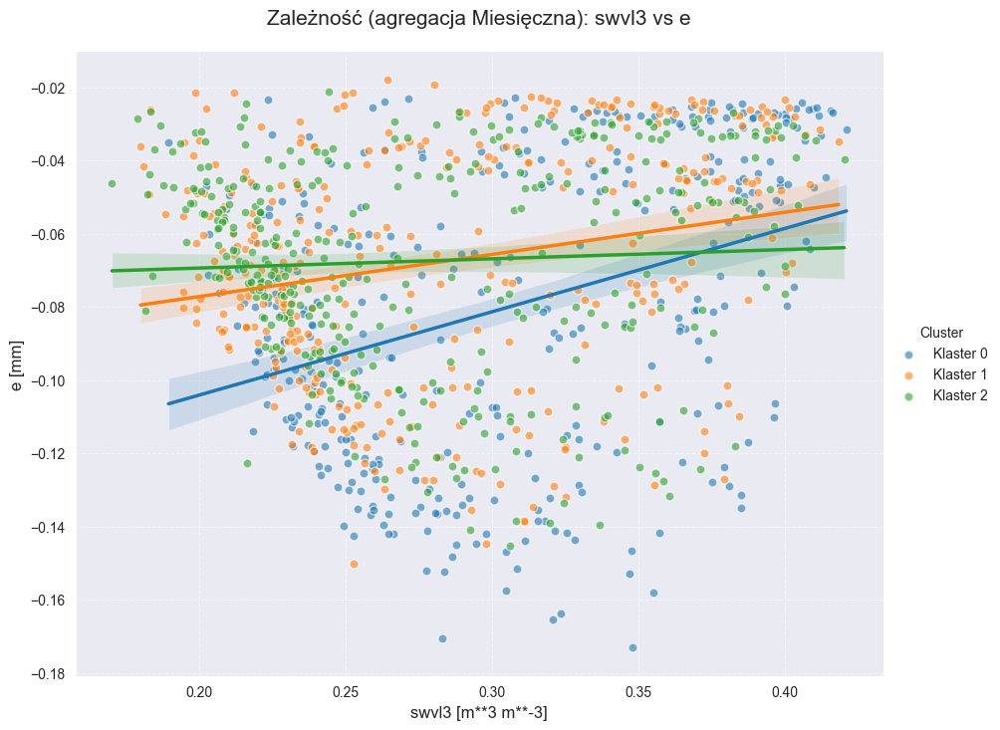

Przetwarzanie danych z agregacją: Miesięczna...


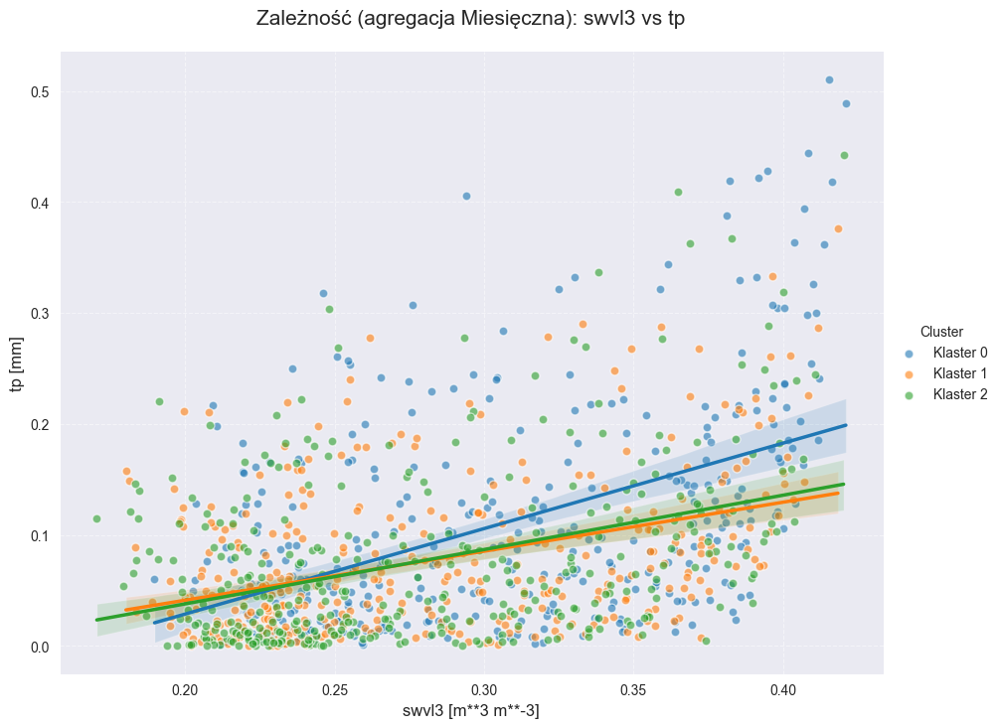

Przetwarzanie danych z agregacją: Miesięczna...


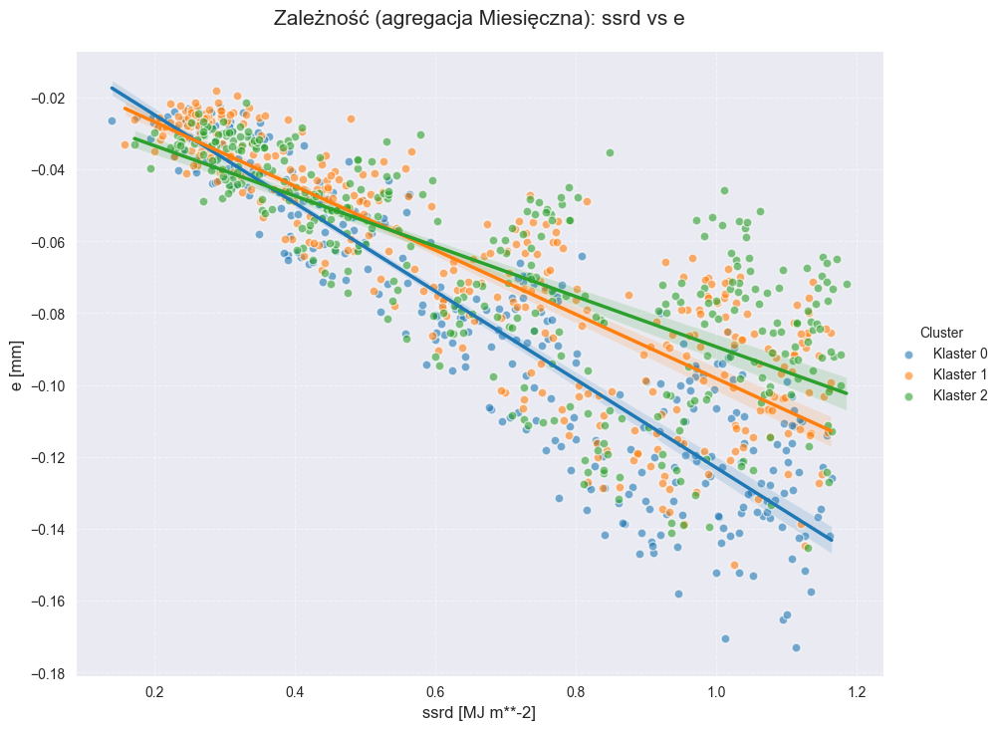

Przetwarzanie danych z agregacją: Miesięczna...


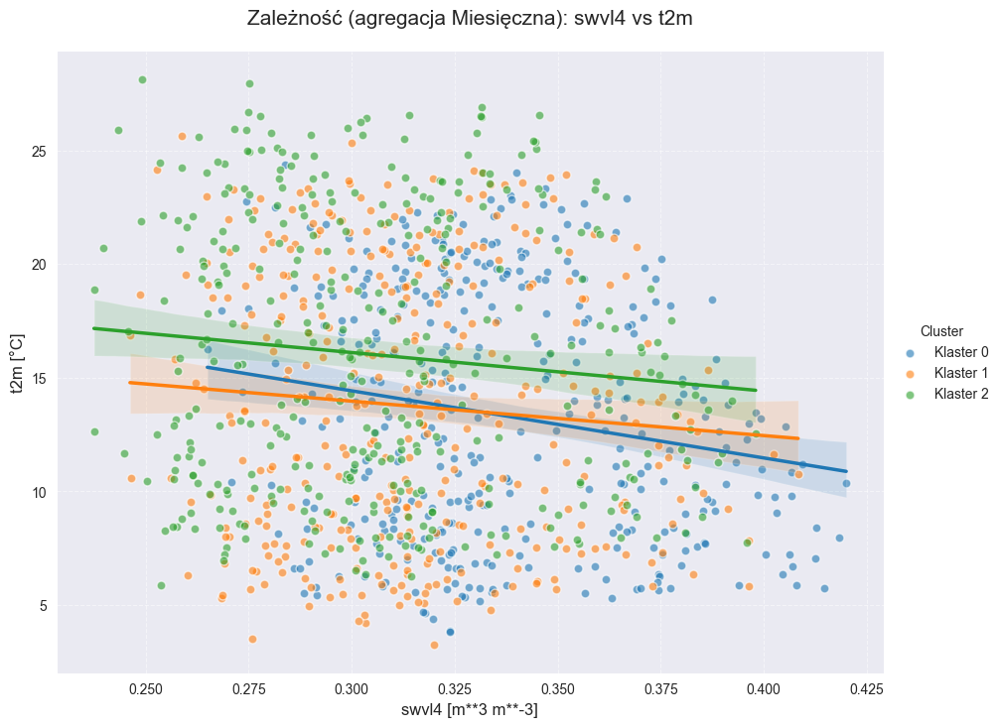

In [59]:
def scatter_analysis_aggregated(ds, x_var, y_var, freq='MS'):
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
    data_list = []

    freq_names = {'MS': 'Miesięczna', 'QS-DEC': 'Sezonowa', 'Y': 'Roczna'}
    freq_desc = freq_names.get(freq, freq)


    for cluster_id in range(3):
        cluster_data = ds.where(ds.cluster == cluster_id, drop=True)
        cluster_resampled = cluster_data.resample(time=freq).mean()
        
        x_series = cluster_resampled[x_var].mean(dim=['latitude', 'longitude']).values
        y_series = cluster_resampled[y_var].mean(dim=['latitude', 'longitude']).values
        
        temp_df = pd.DataFrame({
            x_var: x_series,
            y_var: y_series,
            'Cluster': f'Klaster {cluster_id}'
        })
        data_list.append(temp_df)

    df_plot = pd.concat(data_list).dropna()

    g = sns.lmplot(
        data=df_plot, 
        x=x_var, 
        y=y_var, 
        hue='Cluster', 
        palette=colors,
        height=7, 
        aspect=1.3,
        scatter_kws={'alpha': 0.6, 's': 40, 'edgecolor': 'w'}, 
        line_kws={'linewidth': 2.5}
    )

    x_units = ds[x_var].attrs.get('units', '')
    y_units = ds[y_var].attrs.get('units', '')
    x_label = f"{ds[x_var].attrs.get('short_name', x_var)} [{x_units}]"
    y_label = f"{ds[y_var].attrs.get('short_name', y_var)} [{y_units}]"
    
    plt.xlabel(x_label, fontsize=12)
    plt.ylabel(y_label, fontsize=12)
    plt.title(f"Zależność (agregacja {freq_desc}): {x_var} vs {y_var}", fontsize=15, pad=20)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig(f'agregacja{x_var}_{y_var}.png', dpi=300, bbox_inches="tight")
    plt.show()

scatter_analysis_aggregated(ds_final, 't2m', 'd2m', freq='MS')
scatter_analysis_aggregated(ds_final, 'cape', 'd2m', freq='MS')
scatter_analysis_aggregated(ds_final, 'e', 'wind_dir', freq='MS')
scatter_analysis_aggregated(ds_final, 'swvl3', 'e', freq='MS')
scatter_analysis_aggregated(ds_final, 'swvl3', 'tp', freq='MS')
scatter_analysis_aggregated(ds_final, 'ssrd', 'e', freq='MS')
scatter_analysis_aggregated(ds_final, 'swvl4', 't2m', freq='MS')

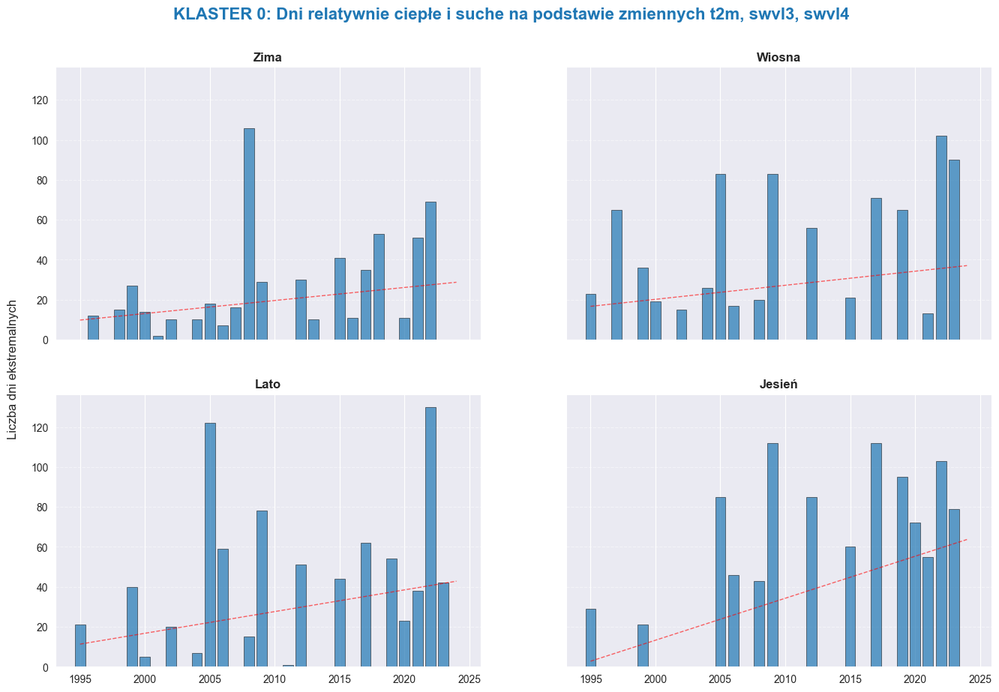

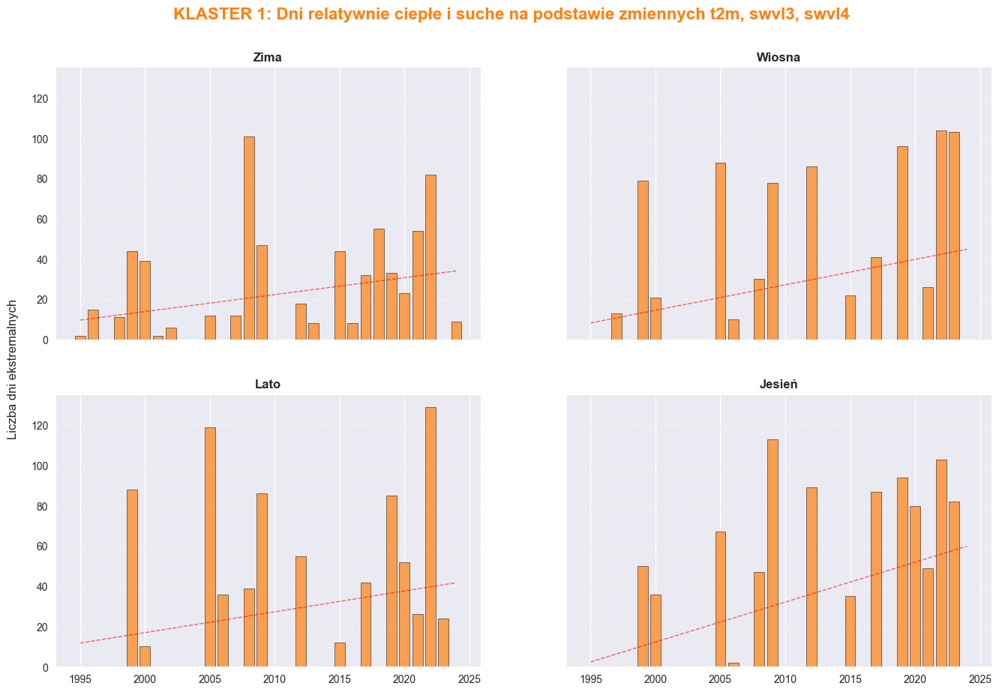

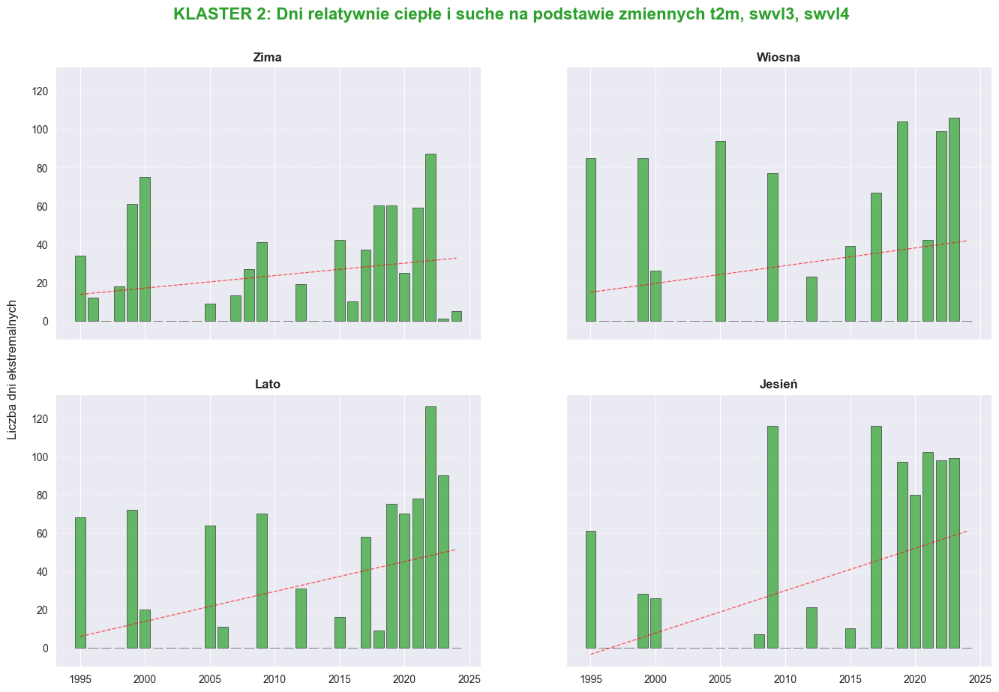

In [65]:
def analyze_cluster_extremes(ds, cluster_id, t_q=0.75, s_q=0.25):
    cluster_colors = {0: '#1f77b4', 1: '#ff7f0e', 2: '#2ca02c'}
    color = cluster_colors.get(cluster_id, 'gray')
    
    ds_cluster = ds.where(ds.cluster == cluster_id, drop=True)
    if ds_cluster.time.size == 0:
        print("Brak danych dla tego klastra.")
        return

    t2m_1d = ds_cluster.t2m.mean(dim=['latitude', 'longitude'])
    swvl3_1d = ds_cluster.swvl3.mean(dim=['latitude', 'longitude'])
    swvl4_1d = ds_cluster.swvl4.mean(dim=['latitude', 'longitude'])
    
    swvl_deep = (swvl3_1d + swvl4_1d) / 2
    
    df = pd.DataFrame({
        'time': ds_cluster.time.values,
        'year': ds_cluster.time.dt.year.values,
        'season': ds_cluster.time.dt.season.values,
        't2m': t2m_1d.values,
        'swvl': swvl_deep.values,
    })

    seasons_order = ['DJF', 'MAM', 'JJA', 'SON']
    season_names = {'DJF': 'Zima', 'MAM': 'Wiosna', 'JJA': 'Lato', 'SON': 'Jesień'}

    fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True, sharey=True)
    axes = axes.flatten()

    all_years = np.arange(df['year'].min(), df['year'].max() + 1)

    for i, code in enumerate(seasons_order):
        ax = axes[i]
        df_season = df[df['season'] == code]

        t_thresh = df_season['t2m'].quantile(t_q)
        s_thresh = df_season['swvl'].quantile(s_q)

        extremes = df_season[
            (df_season['t2m'] > t_thresh) &
            (df_season['swvl'] < s_thresh) 

        ]

        counts = extremes.groupby('year').size().reindex(all_years, fill_value=0)
        
        ax.bar(counts.index, counts.values, color=color, alpha=0.7, width=0.8, edgecolor='black', linewidth=0.5)
        ax.set_title(f"{season_names[code]}", fontsize=12, fontweight='bold')
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        if len(counts) > 5 and counts.sum() > 0:
            z = np.polyfit(counts.index.values, counts.values, 1)
            p = np.poly1d(z)
            ax.plot(counts.index.values, p(counts.index.values), "r--", alpha=0.6, linewidth=1)

    fig.suptitle(
        f"KLASTER {cluster_id}: Dni relatywnie ciepłe i suche na podstawie zmiennych t2m, swvl3, swvl4",
        fontsize=16, y=0.98, color=color, fontweight='bold'
    )
    fig.text(0.08, 0.5, 'Liczba dni ekstremalnych ', va='center', rotation='vertical', fontsize=12)
    plt.subplots_adjust(top=0.90, bottom=0.1, left=0.12)
    plt.savefig(f'agregacja{cluster_id}.png', dpi=300)
    plt.show()

for i in range(3):
    analyze_cluster_extremes(ds_final, cluster_id=i)
